In [1]:
from __future__ import annotations
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import scipy as sp
import math
from dataclasses import dataclass
from typing import Type
from abc import ABC, abstractmethod
import networkx as nx
import copy

# Implementacja symulowanego wyrzażania
## Struktury wspólne dla wszystkich zadań
- Temperature - klasa abstrakcyjna, obsługująca zmianę temperatury oraz obliczająca interesujące nas w danym kroku prawdopodobieństwo. W zadaniu testowałem parę strategii generowania funkcji temperatury i prawdopodobieństwa. Finalnie wybrałem funkcję temperatury jako funkcję **$e^{-x}$** wyskalowaną przy pomocy parametru `max_temperature` w wersji expotencjalnej funkcji temperatury oraz funkcję liniową, której stromość możemy modyfikować za pomocą atrybuty `max_temperature`. Jeżeli chodzi o sposób obliczania prawdopodobieństwa, to używam wyrażenia **$e^{-\frac{(\Delta)}{T}}$**, gdzie **$\Delta$** to różnica pomiędzy starym, a nowym wynikiem minimalizowanej funkcji. Zmiany dokonujemy zawsze, gdy wyrażenie poprawia wynik lub losowo wygenerowana w danycm kroku liczba z przedziału (0,1) jest mniejsza niż prawdopodobieństwo w danym kroku.

- SA - klasa abstrakcyjna, rozszerzalna w każdym zadaniu przez odpowiednią klasę rozwiązującą dany problem. Każda klasa dziedzicząca implementuje metodę `solve`, która jest lwią częścią algorytmu w każdym zadaniu. Klasa zawiera podstawowe atrybuty symulacji, oraz inicjalizuję parametr temperature, w zależności od flagi `exponential` oraz pozostałych podanych parametrów (`max_temperature` i `iteration_num`)


# Zadanie 1
## Struktury charakterystyczne dla zadania 1
- `TS`P - klasa dziedzicząca po SA, która rozwiązuje problem komiwojażera dla wygenerowanej listy kolejnych miast przy użyciu algorytmu symulowanego wyrzażania
- `Point` - klasa reprezentująca miasto ( jego współrzędne i id)

In [2]:
from dataclasses import dataclass
from typing import Type

@dataclass
class Point:
    x :float 
    y :float
    id: int

    def calculate_distance(self, point : Point):
        return np.sqrt( (self.x-point.x)**2 + (self.y-point.y)**2)


In [10]:
from abc import ABC,abstractmethod
import math

class Temperature(ABC):
    def __init__(self, max_temperature, iteration_num):
        self._min_temp = 0
        self._probability = 1.0
        self._max_temp = max_temperature
        self._temperature = max_temperature
        self._iteration_num = iteration_num
        self._gamma = None 
        self._temperature_list = [max_temperature]
        self._probabilities_list = [1]
        self._current_iterator = 0

    @property
    def probability(self):
        return self._probability

    @property
    def temperature_list(self):
        return self._temperature_list

    @property
    def probabilities_list(self):
        return self._probabilities_list

    def check_probability(self, current, new):
        # self.calc_prob()
        if (new-current < 0): return True
        self._probability = min(1, math.exp(-(float(new-current))/float(self._temperature)))
        self._probabilities_list.append(self._probability)
        random = np.random.random()
        if ( random<self._probability):
            return True
        return False

    @abstractmethod
    def cool_down(self):
        pass

    @abstractmethod
    def calc_prob(self):
        pass

    def draw(self,ax):
        ax.plot(range(len(self._temperature_list)),self._temperature_list)
        ax.set_xlabel("Iterations")
        ax.set_ylabel("Temperature")
        # plt.show()
    
    def draw_temperaure(self, ax):
        ax.plot(range(len(self._temperature_list)), self._temperature_list)
        ax.set_xlabel("Iterations")
        ax.set_ylabel("Temperature")
        # plt.show()


    def draw_probabilities(self,ax=None):
        if not ax : ax=plt
        ax.plot(range(len(self._probabilities_list)), self._probabilities_list)
        ax.xlabel("Iterations")
        ax.ylabel("Probability")
        ax.show()

class Temperature_exponential(Temperature):
    def __init__(self, max_temperature, iteration_num):
        super().__init__(max_temperature, iteration_num)
        self._gamma = float(max_temperature) / iteration_num
        self._current_iterator = 0
        # self._gamma =0.994
        # self._gamma = 0.99
    
    def cool_down(self):
        self._current_iterator+=self._gamma
        self._temperature = self._max_temp*math.exp(-(self._current_iterator))
        # self._temperature *= self._gamma
        self._temperature_list.append(self._temperature) 
    
    def calc_prob(self):
        self._probability = math.exp(-self._current_iterator)
        


class Temperature_linear(Temperature):
    def __init__(self, max_temperature, iteration_num):
        super().__init__(max_temperature, iteration_num)
        self._gamma = float(max_temperature) / iteration_num

    def cool_down(self):
        self._temperature -= self._gamma
        self._temperature_list.append(self._temperature)
    
    def calc_prob(self):
        self._probability = self._temperature / self._max_temp
        



In [11]:
class SA(ABC):
    def __init__(self, no_iteration: int, max_temperature,exponential):
        self._each_step_result = list()
        if exponential:
            self._temperature = Temperature_exponential(max_temperature,no_iteration)
        else:
            self._temperature = Temperature_linear(max_temperature,no_iteration)
        self._no_iteration = no_iteration
        self._consecutive = False

    @abstractmethod
    def solve():
        pass 

    def set_consecutive(self):
        self._consecutive=True

class TSP_SA(SA):
    def __init__(self, no_iteration: int, cities,max_temperature, exponential):
        super().__init__(no_iteration, max_temperature, exponential)
        self._n = len(cities)
        self._starting_cities = copy.deepcopy(cities)
        self._distance_matrix = self.calculate_distances()
        self._best_result = self.calculate_path_length(cities)
        self._starting_distance = self._best_result
        self._best_result_cities = copy.deepcopy(cities)
        self._best_results_values = [self._best_result]
    
    def calculate_distances(self):
        distances = np.zeros(self._n**2).reshape(self._n,self._n)
        for i in range(self._n):
            for j in range(i+1,self._n):
                if i==j:
                    continue
                distances[i,j] = distances[j,i] = self._starting_cities[i].calculate_distance(self._starting_cities[j])
        return distances

    def calculate_path_length(self, path):
        sum=0
        for i in range(self._n):
            v1 = path[i].id
            v2 = path[(i+1) % self._n].id
            sum+= self._distance_matrix[v1][v2]
        return sum
    
    def solve(self):
        curr_dist = self._best_result
        curr_cities = copy.deepcopy(self._starting_cities)
        # self._each_step_result.append(curr_dist)
        for _ in range(self._no_iteration):
            v , u = np.random.choice(range(self._n),2, replace = False)
            if (self._consecutive):
                v=(u+1)%self._n
            # new_path = copy.deepcopy(curr_cities)
            # new_path[v], new_path[u] = new_path[u], new_path[v]
            # print(f' u:{u}, v:{v}, Before change: {curr_cities}, After change: {new_path}')
            # curr_dist = self.calculate_path_length(curr_cities)
            # new_dist = self.calculate_path_length(new_path)

            dist_diff = self.calculate_difference(curr_cities,v,u)
            new_dist = curr_dist + dist_diff

            # print(f'curr_dist: {curr_dist}, new_dist {new_dist}')

            if (self._temperature.check_probability(curr_dist,new_dist)):
                curr_cities[v], curr_cities[u] = curr_cities[u], curr_cities[v]
                curr_dist = new_dist
            if (curr_dist < self._best_result):
                self._best_result = curr_dist
                self._best_result_cities = copy.deepcopy(curr_cities)
            self._best_results_values.append(self._best_result)
            self._each_step_result.append(curr_dist)
            self._temperature.cool_down()
    
    def set_consecutive(self):
        return super().set_consecutive()

    def draw_graphs(self):
        fig ,ax = plt.subplots(1,2,figsize=(20,10))
        pos = dict()
        cities = self._best_result_cities
        cities_start = self._starting_cities
        G_start = nx.DiGraph()
        G_res = nx.DiGraph()
        for i,point in enumerate(cities):
            G_res.add_node(i)
            G_start.add_node(i)
            pos[point.id] = (point.x, point.y)
        for i in range(self._n):
            G_res.add_edge(cities[i].id,cities[(i+1)%self._n].id)
            G_start.add_edge(cities_start[i].id, cities_start[(i+1) % self._n].id)
        nx.draw_networkx_nodes(G_res, pos, node_color="orange", node_size=90, ax=ax[1])
        nx.draw_networkx_edges(G_res, pos, ax=ax[1])
        nx.draw_networkx_nodes(G_start, pos, node_color="orange", node_size=90, ax=ax[0])
        nx.draw_networkx_edges(G_start, pos, ax=ax[0])
        ax[0].set_title(f'Starting path length: {self._starting_distance}')
        ax[1].set_title(f'Best path length: {self._best_result}')
        plt.show()


    def draw_temperature(self,ax):
        self._temperature.draw(ax)
        
    def draw_temperature_and_process(self):
        fig, ax = plt.subplots(1,2,figsize=(20,10))
        self.draw_temperature(ax[1])
        self.draw_minimizing_process(ax[0])
        ax[0].set_title("Minimizing process (orange plot indicates current best result)")
        ax[1].set_title("Temperature function over time")
        plt.show()

    def draw_minimizing_process(self,ax):
        # ax , fig = plt.subplot(2,1,1)

        ax.plot(range(len(self._each_step_result)),self._each_step_result)
        ax.plot(range(len(self._best_results_values)),self._best_results_values,color="orange")
        # ax.set_ylim(bottom = 0)
        ax.set_xlabel("Iterations")
        ax.set_ylabel("Length of path")
        # plt.show()

    def calculate_difference(self,cities, index1, index2):
        n= self._n
        prev_v, v, next_v = cities[(
            index1-1) % n].id, cities[index1].id, cities[(index1+1) % n].id
        prev_u, u, next_u = cities[(
            index2-1) % n].id, cities[index2].id, cities[(index2+1) % n].id
        
        distances= self._distance_matrix
        before_sum = distances[prev_v, v] + distances[v, next_v] + distances[prev_u, u] + distances[u, next_u] 
        after_sum = distances[prev_v, u] + distances[u, next_v] + distances[prev_u, v] + distances[v, next_u] 

        if self.check_connection(index1,index2):
            after_sum += 2*distances[u,v]
        return after_sum-before_sum

    def check_connection(self, index1,index2):
        return abs(index1-index2) == 1 or (index1, index2) == (self._n-1, 0) or (index2, index1) == (self._n-1, 0)


    def draw_probabilities(self):
        self._temperature.draw_probabilities()


## Funkcje generujące układ miast według kryteriów określonych w poleceniu

In [12]:
from sys import exit
from itertools import combinations,product
def generate_cities(n):
    return [Point(np.random.random(),np.random.random(),i) for i in range(n) ]

def generate_groups(n,groups=9):
    points = list()
    if n%groups!=0:
        exit(f"Cannot be divided equally into {groups} groups ")
    in_group = n//groups 
    res = list(product(range(3), range(3)))
    row_col_count = int(np.sqrt(groups))
    if row_col_count**2 != groups:
        exit ("Points cannot be put in square of equal dimensions")
    k=0
    # print(res)
    # print("Siema")
    for i,j in res:
        flag =True
        while k%in_group!=0 or flag ==True:
            flag=False
            x= np.random.random()*4 + i * 8* row_col_count 
            y= np.random.random()*4 + j * 8 * row_col_count 
            points.append(Point(x,y,k))
            k+=1
    # print(points)
    np.random.shuffle(points)
    return points


def generate_normal(n):
    cov = np.eye(n)
    mean = np.random.random(n)
    rng = np.random.default_rng()
    x = rng.multivariate_normal(mean,cov,2)
    # print(x)
    return [Point(x[0][i],x[1][i],i) for i in range(n) ]


    

## Funkcja wykonująca symulacje dla podanych parametrów, dodatkowy parametr both=True pozwala na wykonanie dla tego samego zestawu danych najpierw wyrzażanie przy użyciu `consecutive swap`, a następnie `arbitrary swap`.
Każde moje wywołanie zawiera argument both=True, żeby odrazu porównać efekty związane z użyciem odpowiedniego sposobu generowania stanu sąsiedniego. Najpierw dokonuje analizy wyników przy pomocy użyciu expotencjalnej funkcji temperatury, a następnie przechodzę do funkcji liniowej. W przypadku funkcji ekspotencjalnej i rozkładu punktów w 9 grupach, zmieniam strategię generowania funkcji prawdopodobieństwa jako $e^{-x}$, gdzie x to jest `obecna_iteracja * max_temp/iteration_num`

In [13]:
def run_SA_TSP(iteratrion_num, num_of_cities,max_temperature, cities_generator= generate_cities, exponential = True, both = False):
    consecutive = False
    cities = cities_generator(num_of_cities)
    tsp : SA  = TSP_SA(iteratrion_num,cities,max_temperature ,exponential)
    if both:
        for consecutive in (True,False):    
            tsp: SA = TSP_SA(iteratrion_num, cities,
                             max_temperature, exponential)
            print(f'{"CONSECUTIVE" if consecutive else "ARBITRARY"} SWAP')
            if consecutive:
                tsp.set_consecutive()
        
            tsp.solve()
            tsp.draw_temperature_and_process()
            tsp.draw_graphs()
            # tsp.draw_probabilities()
    else :
        tsp.solve()
        tsp.draw_temperature_and_process()
        tsp.draw_graphs()


### Losowy rozkład punktów

CONSECUTIVE SWAP


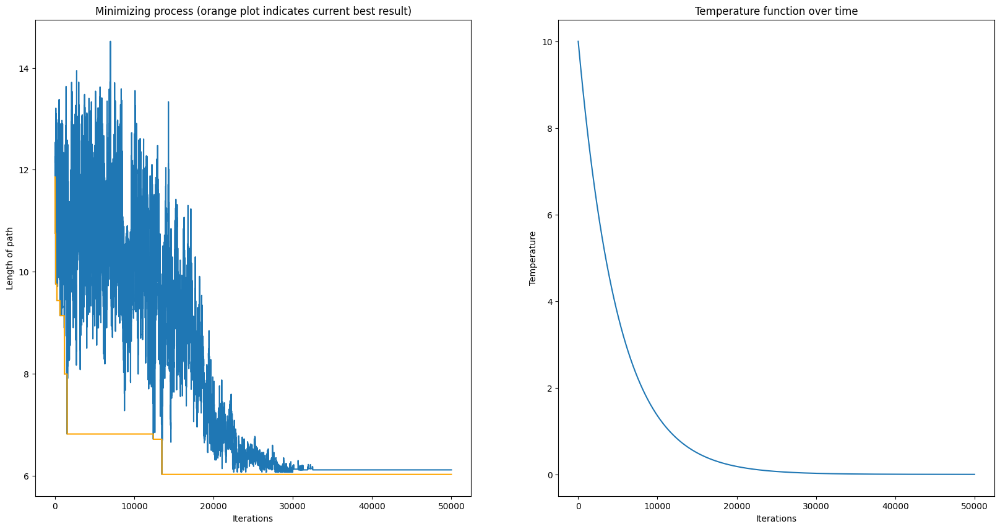

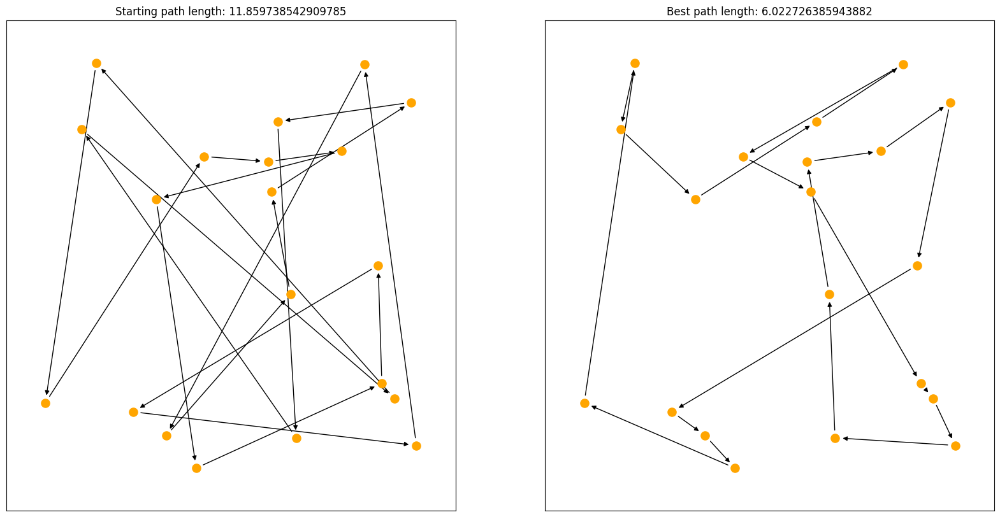

ARBITRARY SWAP


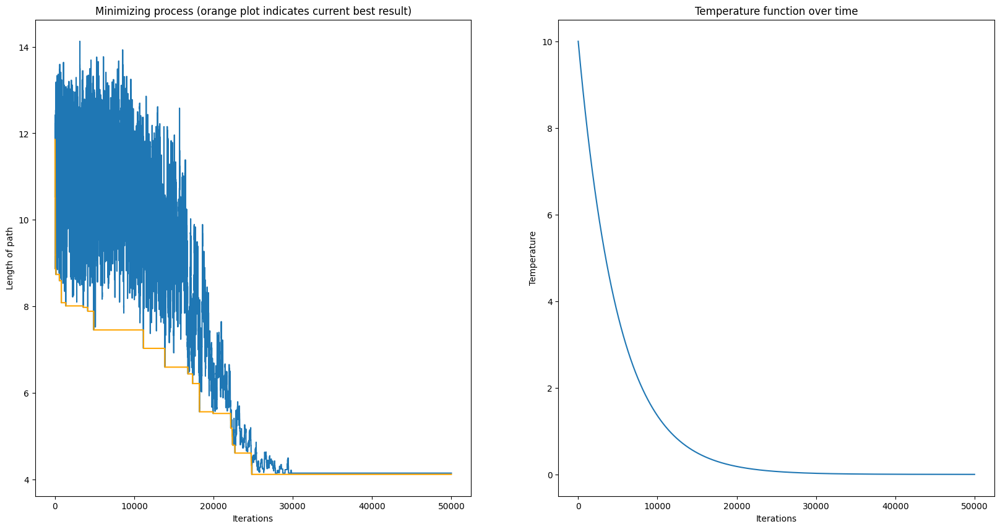

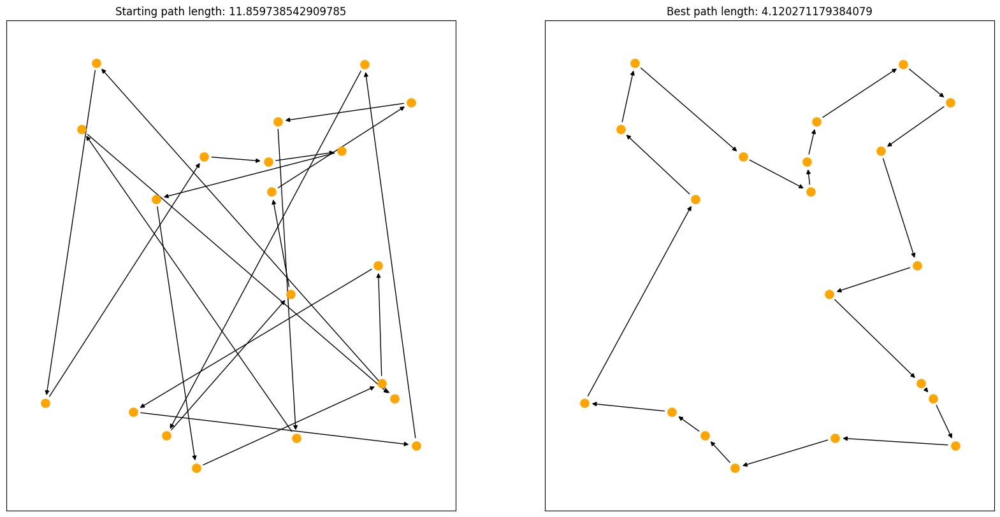

In [15]:
run_SA_TSP(50000,20,10, both = True)

CONSECUTIVE SWAP


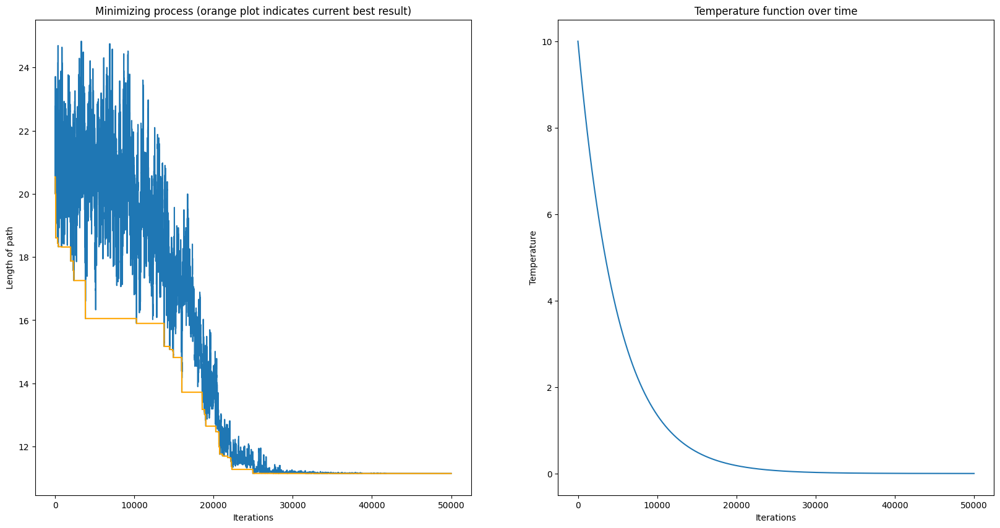

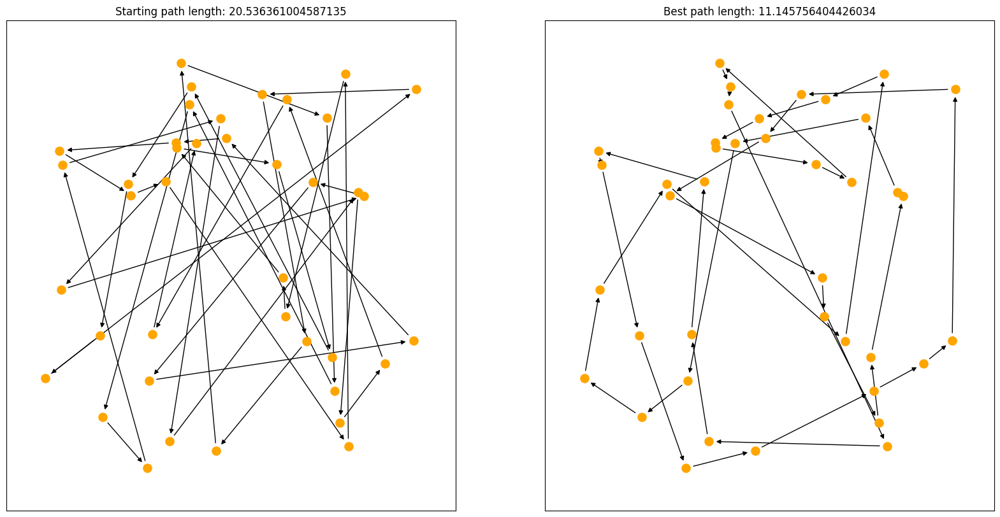

ARBITRARY SWAP


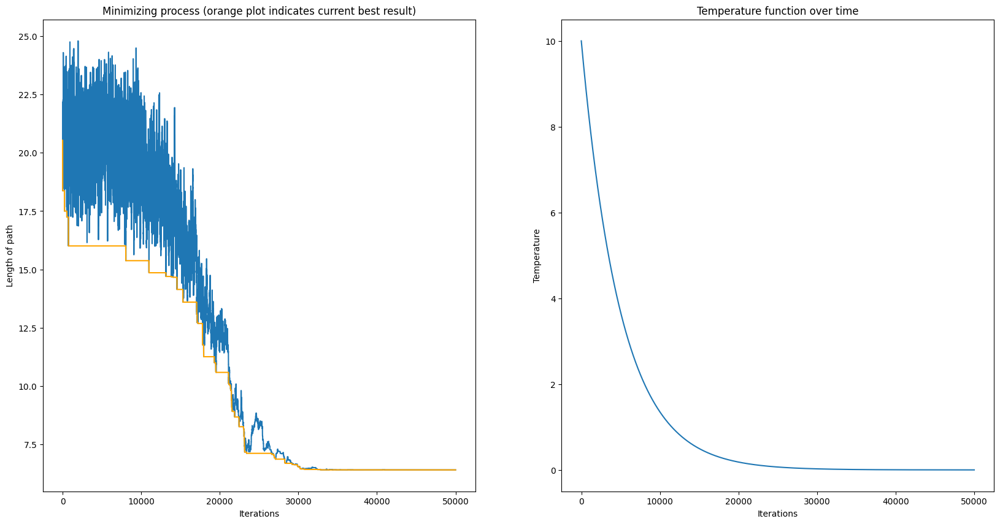

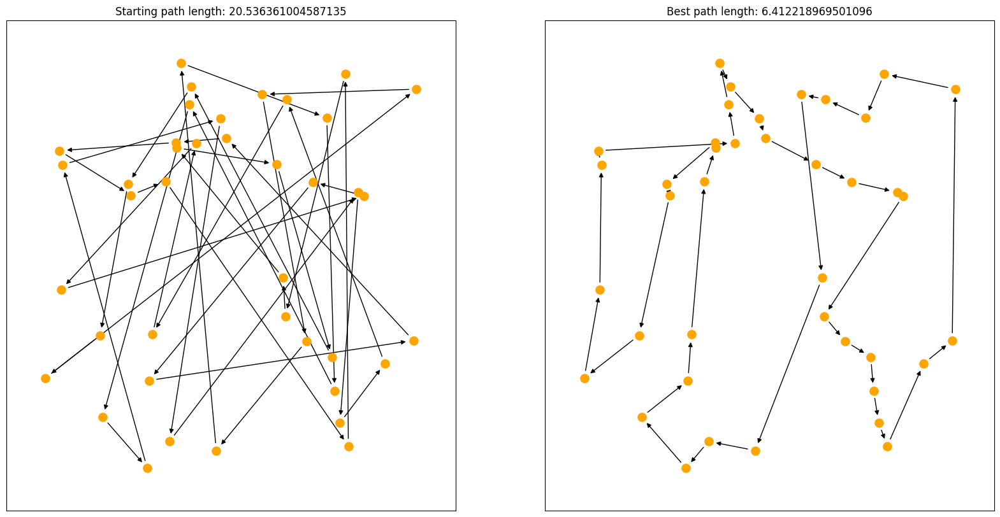

In [90]:
run_SA_TSP(50000,40,10, both=True)

### Rozkład punktów w 9 grupach

CONSECUTIVE SWAP


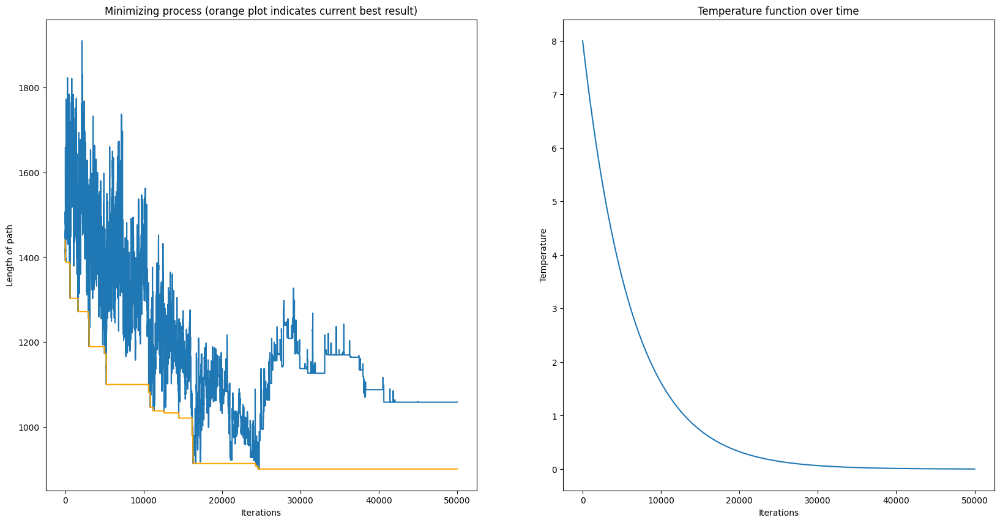

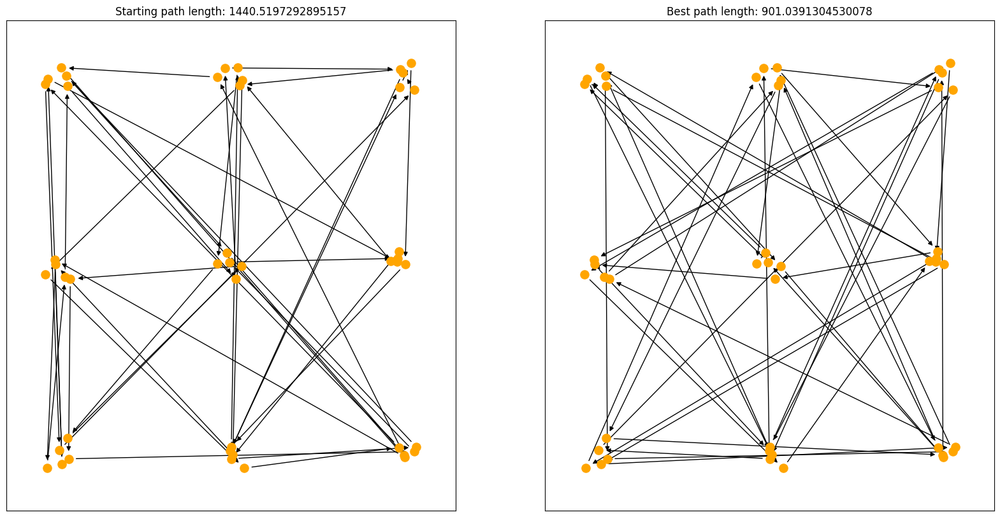

ARBITRARY SWAP


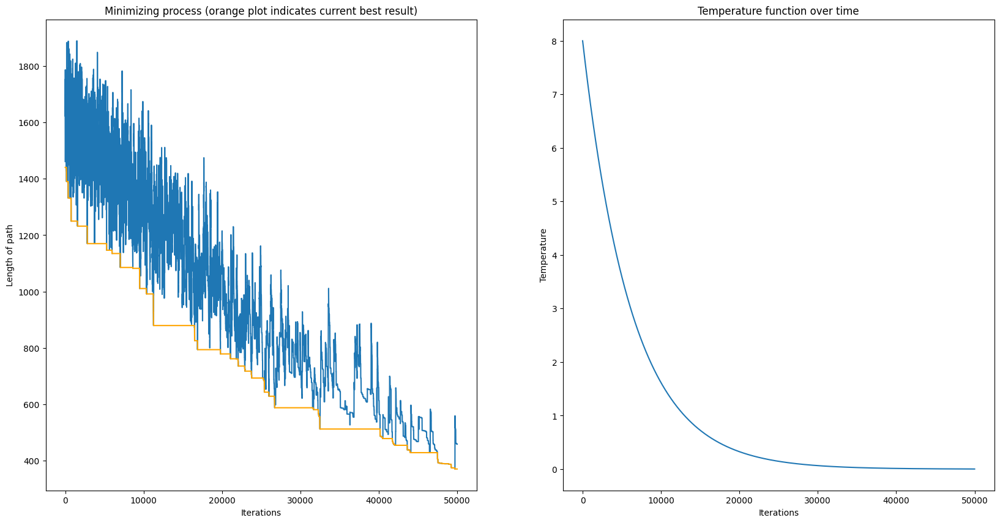

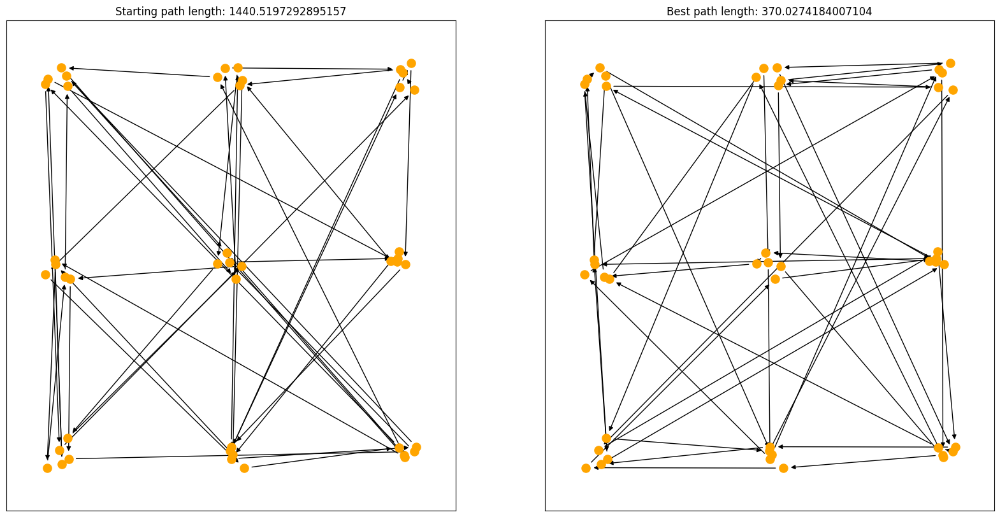

In [111]:
run_SA_TSP(50000,45,8,cities_generator=generate_groups, both=True)

CONSECUTIVE SWAP


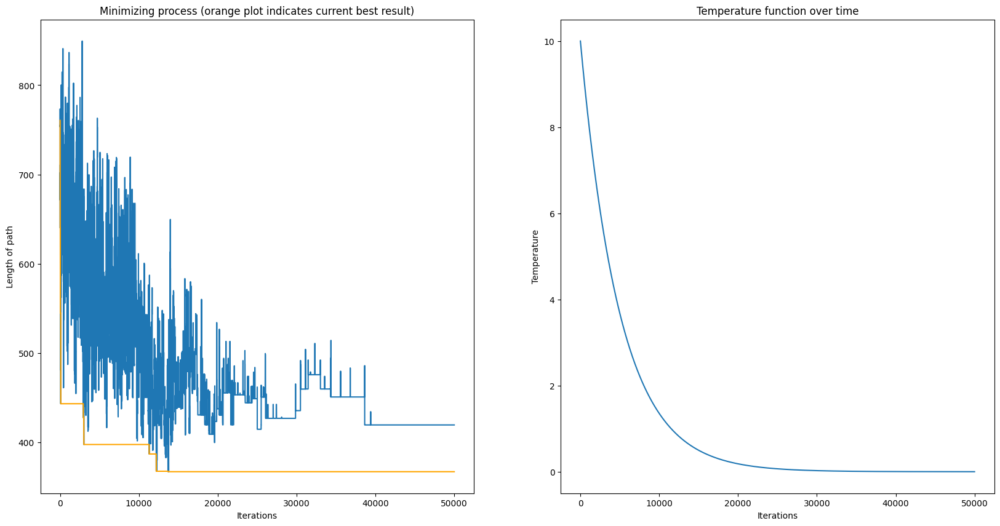

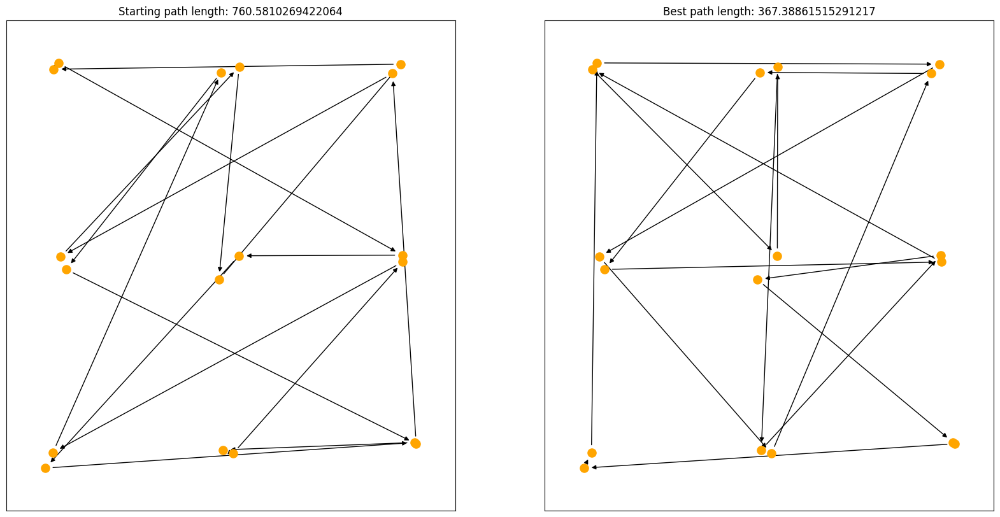

ARBITRARY SWAP


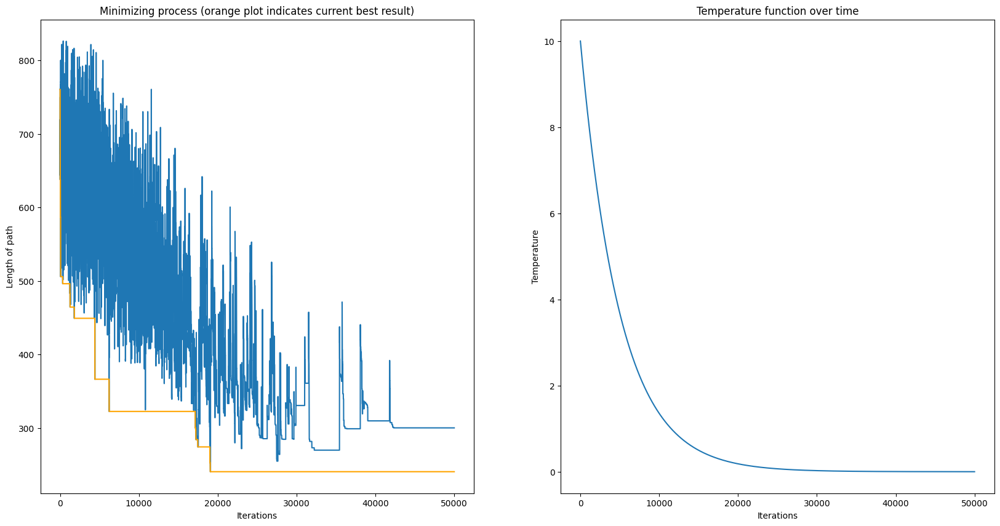

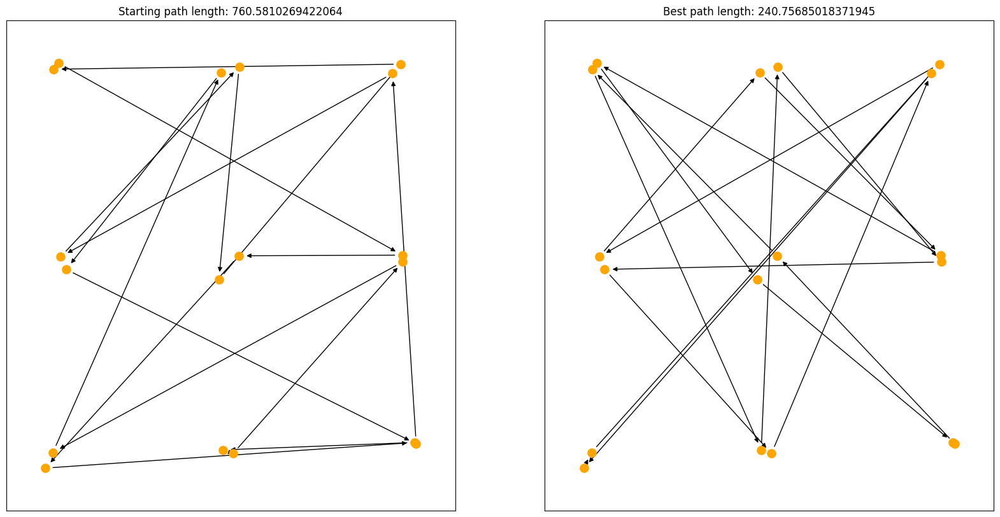

In [108]:
run_SA_TSP(50000,18,10,cities_generator=generate_groups, both=True)

### Normalny rozkład punktów

CONSECUTIVE SWAP


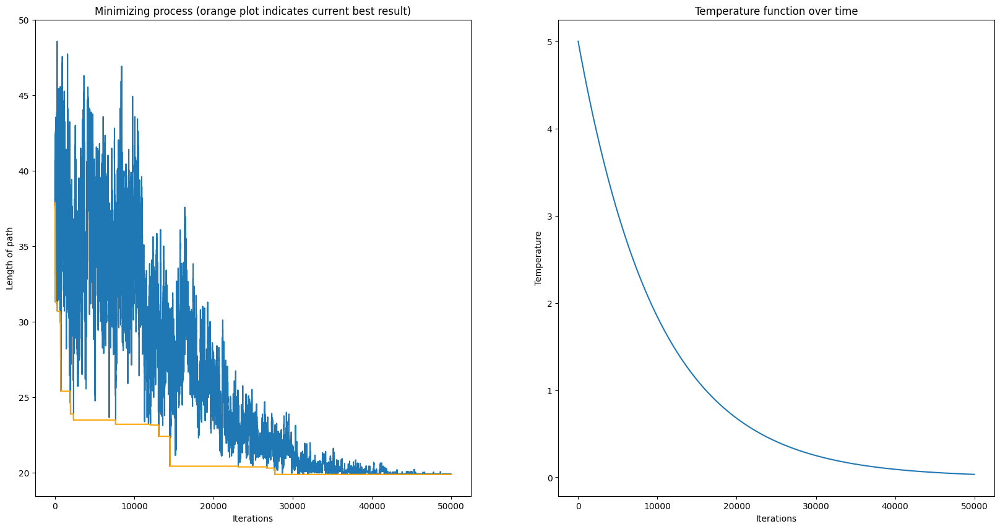

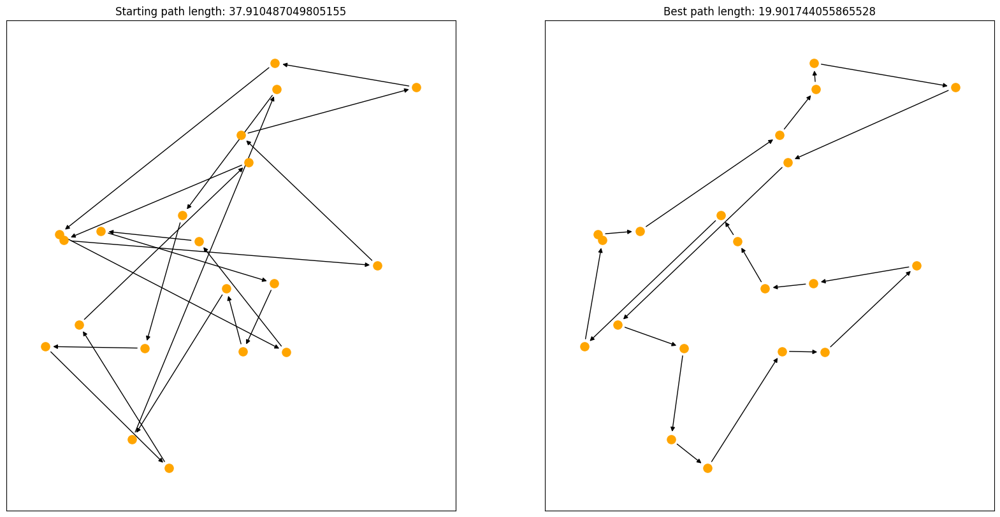

ARBITRARY SWAP


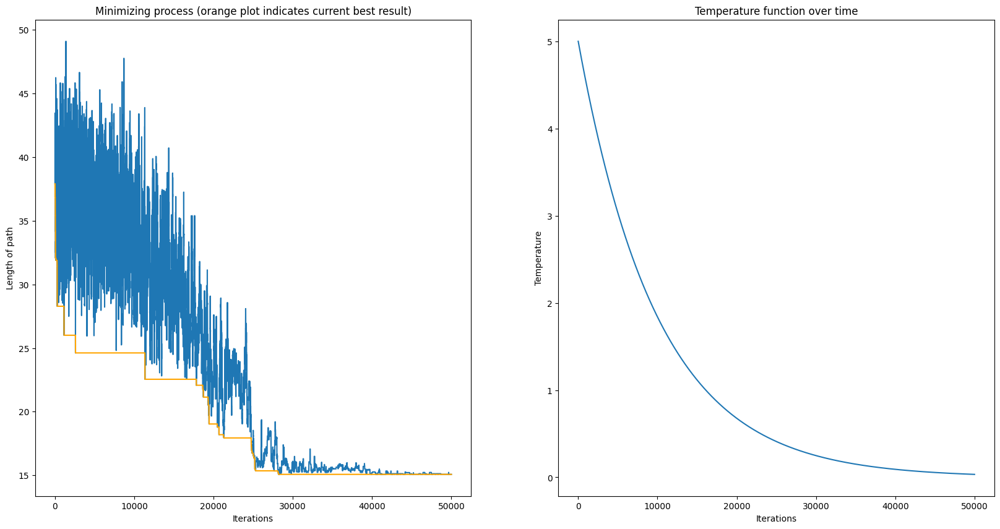

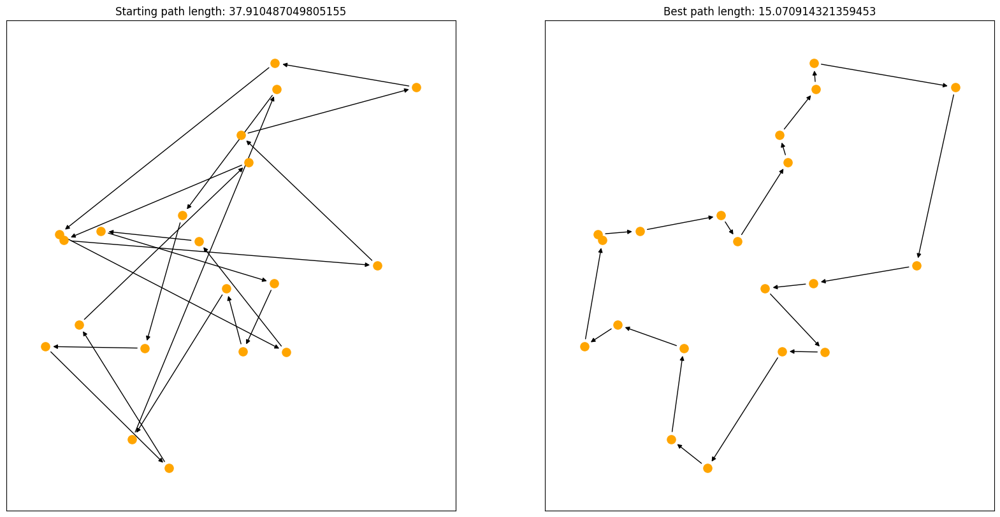

In [96]:
run_SA_TSP(50000, 20,5, cities_generator=generate_normal, both=True)

### Rozkład losowy

CONSECUTIVE SWAP


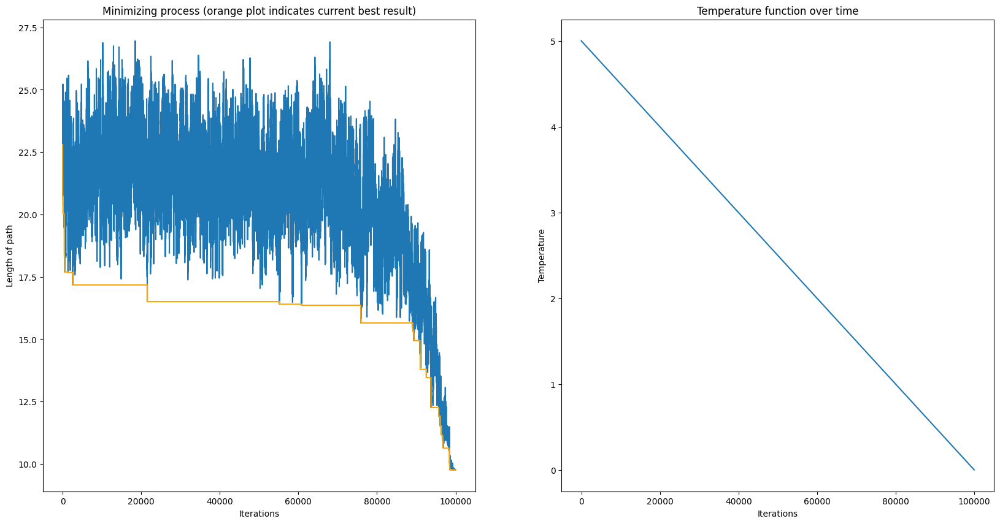

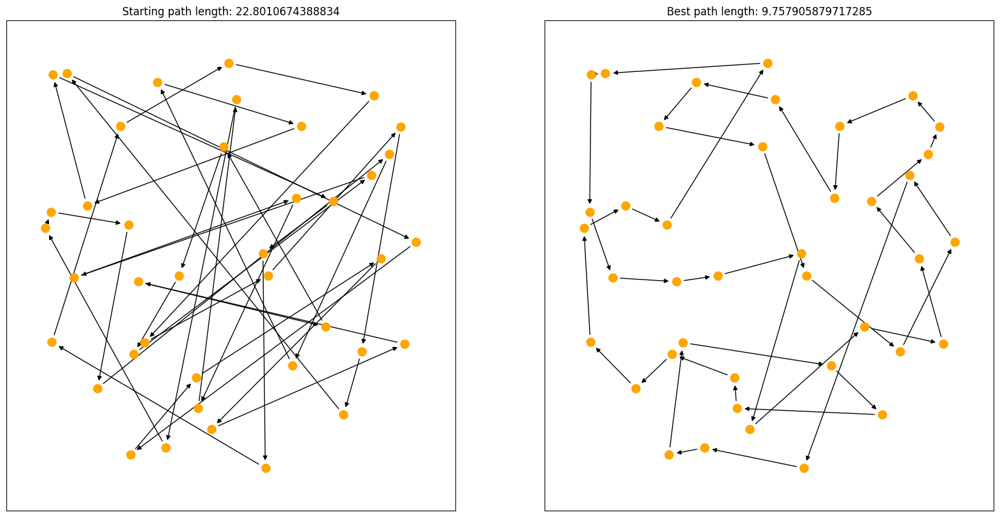

ARBITRARY SWAP


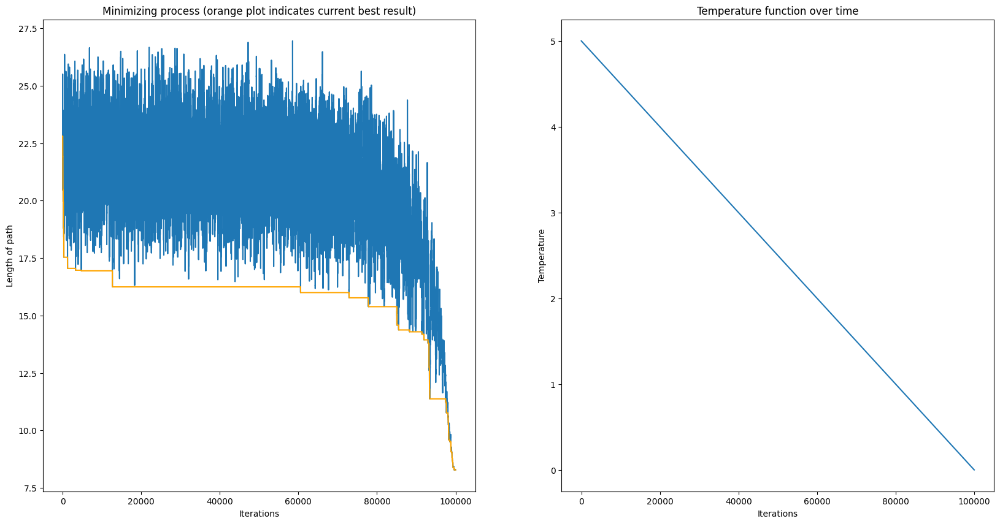

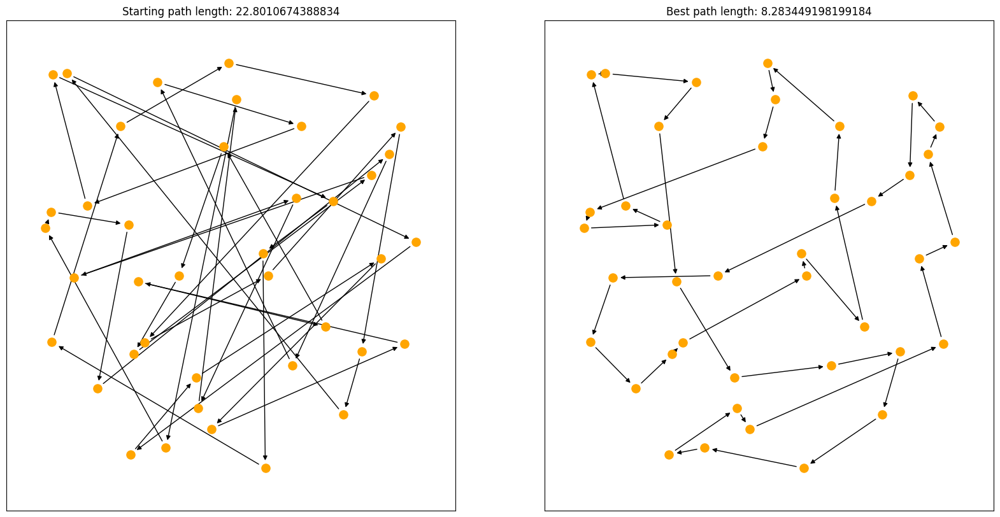

In [97]:
run_SA_TSP(100000, 40,5,exponential=False, both=True)

### Rozkład punktów w 9 grupach

CONSECUTIVE SWAP


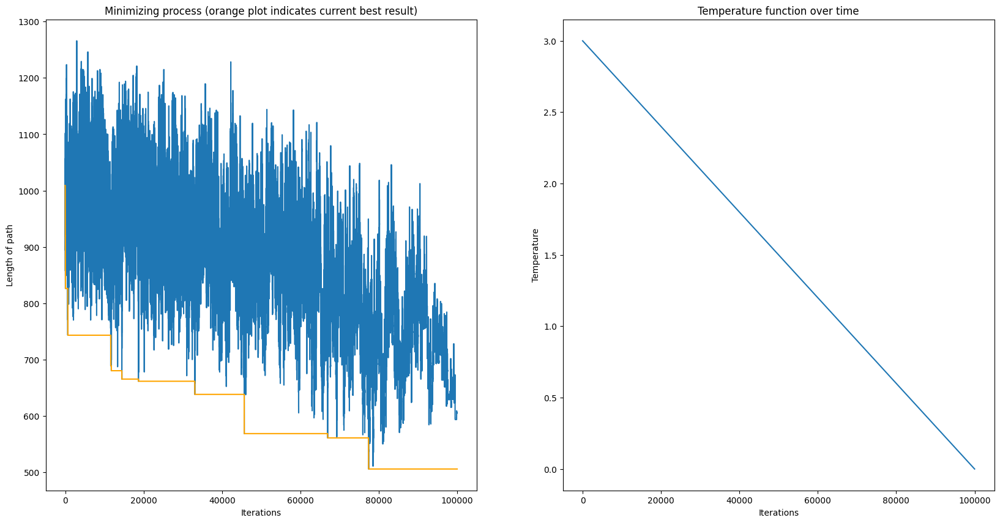

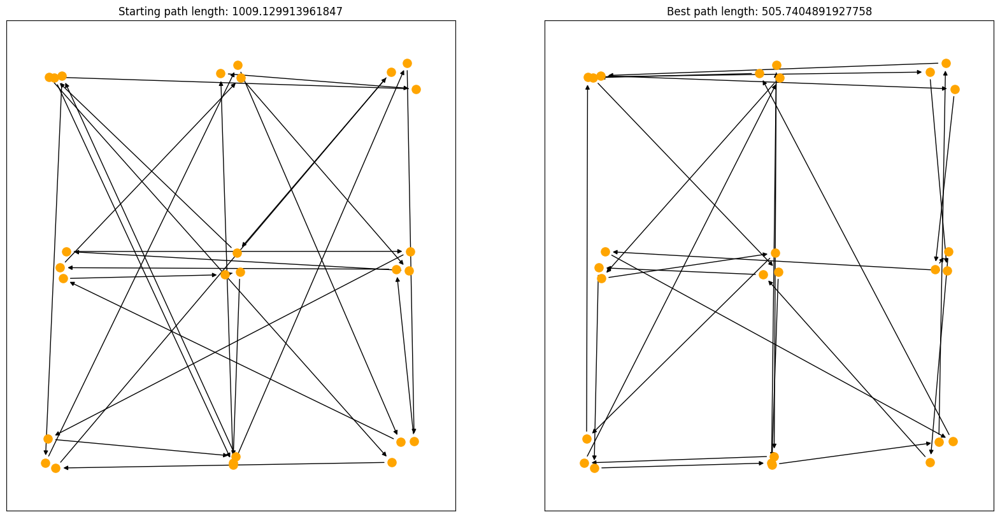

ARBITRARY SWAP


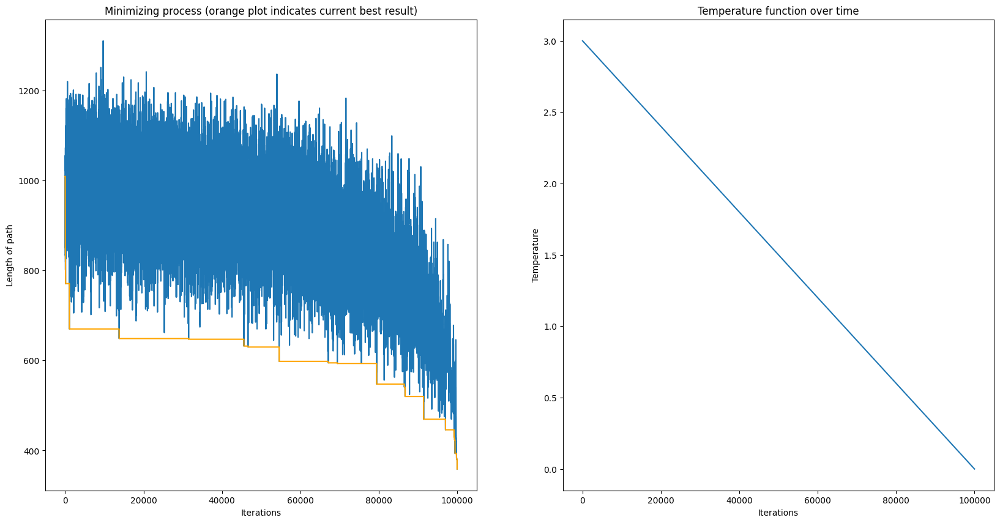

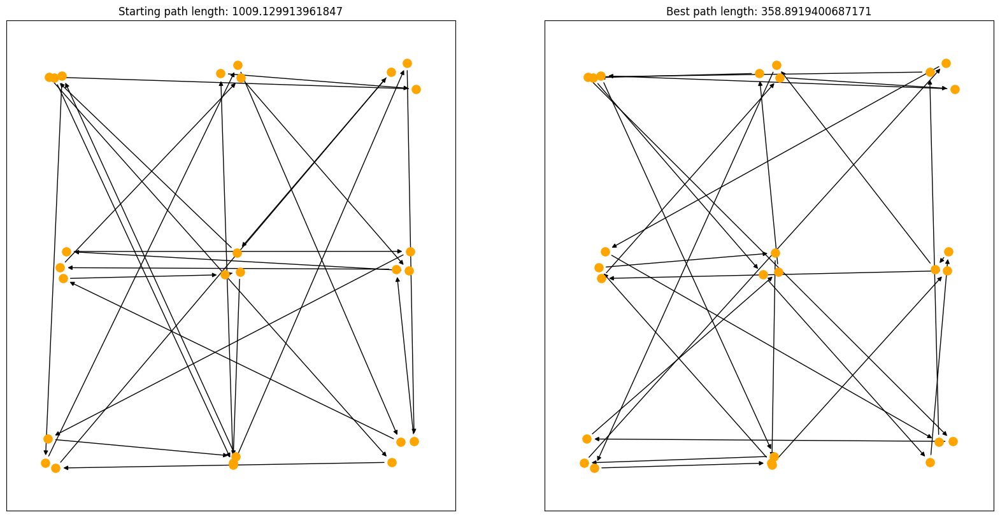

In [107]:
run_SA_TSP(100000, 27,3,exponential=False, cities_generator=generate_groups,both=True)

## Wnioski 
Widzimy, że w każdym przypadku strategia `arbitrary_swap` przynosi lepsze rezultaty niż `consecutive_swap`. Funkcja ekspotencjalna daje lepsze rezultaty niż funkcja liniowa, wynika to z większej i dłuższej otwartości na przyjmowanie lokalnie mniej optymalnych rozwiązań niż w przypadku funkcji ekspotencjalnej. Oznacza to, że kształt i wartość funkcji temperatury ma bardzo duży wpływ na wynik symulowanego wyrzażania, więc ważny jest dobór odpowiednich parametrów do każdej symulacji. Wykres zależności aktualnej długości ścieżki od liczby iteracji jest zgodny z oczekiwaniami w każdym przypadku, w niektórych wpadamy trochę szybciej w minimum lokalne, w innych proces ten jest bardziej odwleczony w czasie. Dla każdej symulacji długość ścieżki jest widocznie zredukowana, dla przypadku z generowaniem grup nie jest to tak widoczne zawsze na rysunku, ale wykres długości ścieżki od ilości iteracji i długość końcowej ścieżki potwierdzają poprawny przebieg wyrzażania.

# ZADANIE 2

## Funkcja generująca macierz binarną zero-jedynkową z podaną gęstością jedynek

In [8]:
def create_binary_image(n: int, p:float):
    M = np.zeros(n**2)
    ones = round(n**2*p)
    indexes = np.random.choice(range(0,n**2),ones, replace=False)
    np.put(M,indexes,1)
    # ones[indexes] = 1
    # print(M)
    return M.reshape(n,n)

## Struktury w zadaniu 2
- `Energy` - klasa odpowiadająca za obliczanie energii i zwracanie "sąsiadów" dla danego stanu.
- `BinImage` - klasa dziedzicząca po SA, wykonująca symulowane wyżarzanie dla określonego problemu
### Zaproponowałem 6 wariantów sąsiedztwa
- `Vertical Horizontal` - sąsiedzi w górę, w dół, na lewo i na prawo 
- `Cross` - sądziedzi na ukos kolejno : lewa-góra, prawa-góra, lewy-dół, prawy-dół
- `Col_5`  - sąsiedzi jako pięć najbliższych do góry i pięć najbliższych w dół
- `Row_5` - analogicznie do `Col_5` tylko horyzontalnie
- `Cross_5` - analogicznie do wcześniejszych tylko na ukos w kierunku lewy-dół do prawa-góra
- `Around` - bezpośredni sąsiedzi danego stanu

### Funkcja, która minimalizujemy
Jako funkcję która będziemy minimalizować wybrałem $(-6)*x^{3}$ gdzie x to liczba sąsiadów będących "1" (zielonych). Dzięki takiemu charakterowi funkcji, dokonując symulowanego wyrzażania będziemy dążyć do uzyskania jak największej liczby stanów o danym sąsiedztwie ( przyjmując funkcję o wartościach dodatnich, dążylibyśmy do wykluczenia danego sąsiedztwa). 
Efekty wywołań funkcji znajdują się poniżej.

In [16]:
class Energy(ABC):
    def __init__(self, func = lambda x :(-6) * x**3) -> None:
        super().__init__()
        self.energy_func = func

    @property
    def energy_function(self):
        return self._energy_func
    
    @energy_function.setter
    def energy_func(self, func):
        self._energy_func = func
    
    def calculate_energy(self, matrix :np.ndarray, coords: tuple):
        neighbours = self.get_neighbours()

    def calculate_sum_active(self, matrix : np.ndarray, coords):
        result = sum(matrix[cord] for cord in self.get_neighbours(matrix,coords))
        return result

    @abstractmethod
    def get_neighbours(self,  matrix: np.ndarray, coords: tuple):
        pass


class Vertical_Horizontal(Energy):
    def __init__(self, func=None) -> None:
        if func != None:
            super().__init__(func)
        else:
            super().__init__()
    
    def get_neighbours(self, matrix: np.ndarray, coords: tuple):
        n = matrix.shape[0]
        x= coords[0]
        y = coords[1]
        return [ ((x-1)%n,y), ((x+1)%n,y), (x,(y+1)%n), (x,(y-1)%n)]
    
class Cross(Energy):
    def __init__(self, func=None) -> None:
        if func != None:
            super().__init__(func)
        else:
            super().__init__()
    
    def get_neighbours(self, matrix: np.ndarray, coords: tuple):
        n = matrix.shape[0]
        x= coords[0]
        y = coords[1]
        return [ ((x-1)%n,(y-1)%n), ((x+1)%n,(y-1)%n), ((x-1)%n,(y+1)%n), ((x+1)%n,(y-1)%n)]
    

class Col_5(Energy):
    def __init__(self, func=None) -> None:
        if func != None:
            super().__init__(func)
        else:
            super().__init__()

    def get_neighbours(self, matrix: np.ndarray, coords: tuple):
        n = matrix.shape[0]
        x = coords[0]
        y = coords[1]
        return [(x,(y-i)%n) for i in range(-6,6) if i!=0 ]


class Row_5(Energy):
    def __init__(self, func=None) -> None:
        if func!=None:
            super().__init__(func)
        else:
            super().__init__()

    def get_neighbours(self, matrix: np.ndarray, coords: tuple):
        n = matrix.shape[0]
        x = coords[0]
        y = coords[1]
        return [((x-i) % n, y) for i in range(-6, 6) if i != 0]

class Cross_5(Energy):
    def __init__(self, func=None) -> None:
        if func!=None:
            super().__init__(func)
        else:
            super().__init__()

    def get_neighbours(self, matrix: np.ndarray, coords: tuple):
        n = matrix.shape[0]
        x = coords[0]
        y = coords[1]
        return [((x-i) % n, (y-i) % n) for i in range(-6, 6) if i != 0]
    

class Around(Energy):
    def __init__(self, func=None) -> None:
        if func != None:
            super().__init__(func)
        else:
            super().__init__()

    def get_neighbours(self, matrix: np.ndarray, coords: tuple):
        n = matrix.shape[0]
        x = coords[0]
        y = coords[1]
        res_1 = [((x-1) % n, (y-1) % n), ((x+1) % n, (y-1) % n),
                 ((x-1) % n, (y+1) % n), ((x+1) % n, (y-1) % n)]
        res_2 = [((x-1) % n, y), ((x+1) % n, y),
                 (x, (y+1) % n), (x, (y-1) % n)]
        res_1.extend(res_2)
        return res_1

class BinImage(SA):
    def __init__(self, no_iteration: int, max_temperature, exponential, image, neighbourhood, func):
        super().__init__(no_iteration, max_temperature, exponential)
        self._func = func
        self._n = image.shape[0]
        self._image =np.copy(image) 
        self._starting_image = np.copy(image)
        self._best_image =np.copy(image)
        self._best_results_values = list()
        self._energy = None 
        self.associate_neighbourhood(neighbourhood)
        self.create_energy_matrix()
        self.calculate_starting_energy()
        self._best_results_values.append(self._best_result)
    
    def calculate_starting_energy(self):
        v_f = np.vectorize(self._energy.energy_function)
        result = np.sum(v_f(self._neighbourhood_matrix))
        self._best_result = result
        self._starting_result = result


    def associate_neighbourhood(self, neighbourhood):
        choices = {
            "Vertical_Horizontal": Vertical_Horizontal,
            "Cross": Cross,
            "Row_5": Row_5,
            "Col_5": Col_5,
            "Cross_5": Cross_5,
            "Around": Around
            }
        self._energy = choices[neighbourhood](self._func)

    def create_energy_matrix(self):
        n= self._n
        matrix = np.zeros(n**2).reshape(n,n)
        for i in range(n):
            for j in range(n):
                matrix[i, j] = self._energy.calculate_sum_active(self._image, (i,j))
        self._neighbourhood_matrix = np.copy(matrix)

    def calculate_energy_delta(self, coord1, coord2):
        v_r,v_c = coord1
        u_r,u_c = coord2
        matrix = self._image 
        n_matrix = self._neighbourhood_matrix
        if matrix[coord1]==matrix[coord2]:
            return 0 
        v_neighbours = self._energy.get_neighbours(matrix,(v_r,v_c) ) 
        u_neighbours = self._energy.get_neighbours(matrix,(u_r,u_c) )
        # common = np.intersect1d(v_neighbours,u_neighbours)
        
        common = list(set(v_neighbours).intersection(u_neighbours))

        v_neighbours = [neigh for neigh in v_neighbours if neigh not in common]
        u_neighbours = [neigh for neigh in u_neighbours if neigh not in common]
        # print(common)        
        # print(v_neighbours)        
        # print(u_neighbours)  
        factor  = 1 if matrix[v_r,v_c]==0 else -1     

        before_sum = 0 
        after_sum=0
        for coords in v_neighbours:
            before_sum += self._energy.energy_function(
                self._neighbourhood_matrix[coords])
            after_sum += self._energy.energy_function(
                self._neighbourhood_matrix[coords]+factor)
        for coords in u_neighbours:
            before_sum += self._energy.energy_function(
                self._neighbourhood_matrix[coords])
            after_sum += self._energy.energy_function(
                self._neighbourhood_matrix[coords]-factor)

        if (coord1 in u_neighbours) or ( coord2 in v_neighbours):
            before_sum += self._energy.energy_function(self._neighbourhood_matrix[coord1]) + \
                self._energy.energy_function(
                    self._neighbourhood_matrix[coord2])
            after_sum += self._energy.energy_function(self._neighbourhood_matrix[coord1]+factor) + \
                self._energy.energy_function(
                    self._neighbourhood_matrix[coord2]-factor)
        return after_sum - before_sum

    def mutate_matrices(self, coord_1, coord_2):
        if self._image[coord_1] == self._image[coord_2]:
            return 

        v_neighbours = self._energy.get_neighbours(self._image, coord_1)
        u_neighbours = self._energy.get_neighbours(self._image, coord_2)

        factor = 1 if self._image[coord_1] == 0 else -1

        for coords in v_neighbours:
            self._neighbourhood_matrix[coords] += factor
            
        for coords in u_neighbours:
            self._neighbourhood_matrix[coords] -= factor

        self._image[coord_1],self._image[coord_2]= self._image[coord_2],self._image[coord_1]


    def solve(self):
        n = self._n
        self._each_step_result.append(self._starting_result)
        current_matrix = np.copy(self._neighbourhood_matrix)
        current_result = self._starting_result
        for i in range(self._no_iteration):
            v, u = np.random.choice(range(n**2), 2, replace=False)
            if (self._consecutive):
                v = (u+1) % (n**2)
            v_r,v_c = v//n , v%n 
            u_r,u_c = u//n , u%n 
            diff = self.calculate_energy_delta((v_r,v_c),(u_r,u_c))
            after = current_result + diff
            if (self._temperature.check_probability(current_result,after)):
                self.mutate_matrices((v_r, v_c), (u_r, u_c))
            if after < self._best_result:
                self._best_result = after 
                current_result = after 
                self._best_image = np.copy(self._image)
            self._each_step_result.append(current_result)
            self._temperature.cool_down()
            self._best_results_values.append(self._best_result)

    def draw_images(self):
        n = self._image.shape[0]
        fig, ax = plt.subplots(1,2, figsize=(20,10))
        G0 = nx.Graph()
        G1 = nx.Graph()
        color_map_0 = list()
        color_map_1 = list()
        pos_0 = dict()
        pos_1 = dict()
        node_size = 20
        for i in range(n**2):
            G0.add_node(i)
            G1.add_node(i)
            coord = (i // n, i % n)
            # coord = (i % n, i // n)
            pos_0[i] = coord
            pos_1[i] = coord
            color_map_0.append("green" if self._starting_image[coord]==1 else "#333"   )
            color_map_1.append("green" if self._best_image[coord]==1 else "#333"   )
        ax[0].set_title(f'Before Simulated Annealing -> Energy: {self._starting_result}')
        ax[1].set_title(f'After Simulated Annealing -> Energy: {self._best_result}')
        nx.draw_networkx_nodes(G0,pos = pos_0,ax=ax[0], node_color=color_map_0,  node_size = node_size)
        nx.draw_networkx_nodes(G1,pos = pos_1,ax=ax[1], node_color=color_map_1, node_size = node_size)
        ax[0].set_facecolor("#333")
        ax[1].set_facecolor("#333")
        plt.show()

    def draw_temperature(self, ax):
        self._temperature.draw(ax)

    def draw_temperature_and_process(self):
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        self.draw_temperature(ax[1])
        self.draw_minimizing_process(ax[0])
        ax[0].set_title(
            "Minimizing process (orange plot indicates current best result)")
        ax[1].set_title("Temperature function over time")
        plt.show()

    def draw_minimizing_process(self, ax):
        # ax , fig = plt.subplot(2,1,1)

        ax.plot(range(len(self._each_step_result)), self._each_step_result, color = "red")
        ax.plot(range(len(self._best_results_values)),
                self._best_results_values, color="orange")
        # ax.set_ylim(bottom = 0)
        ax.set_xlabel("Iterations")
        ax.set_ylabel("Energy")
        # plt.show()


### Funkcja dokonująca symulacji dla danych parametrów, both= True wykonuje wyrzażanie zarówno dla funkcji ekspotencjalnej jak i liniowej temperatury dla tego samego zestawu danych

In [17]:
def proceed_binary(n,p, iteration_num, max_temp, neighbourhood= "Row_5",exponential=True, func=None, both=False):
    bin_matrix = create_binary_image(n,p)
    matrix_cp = np.copy(bin_matrix)

    # "Vertical_Horizontal"
    # "Cross"
    # "Row_5"
    # "Col_5"
    # "Cross_5"
    if both: 
        bin_img = BinImage(iteration_num, max_temp, exponential=True,
                        image=bin_matrix, neighbourhood=neighbourhood, func=func)
        bin_img.solve()
        bin_img.draw_images()
        bin_img.draw_temperature_and_process()
        bin_img = BinImage(iteration_num, max_temp, exponential=False,
                           image=matrix_cp, neighbourhood=neighbourhood, func=func)
        bin_img.solve()
        bin_img.draw_images()
        bin_img.draw_temperature_and_process()
    else: 
        bin_img = BinImage(iteration_num, max_temp, exponential=exponential,
                           image=bin_matrix, neighbourhood=neighbourhood, func=func)
        bin_img.solve()
        bin_img.draw_images()
        bin_img.draw_temperature_and_process()
    # bin_img._temperature.draw_probabilities()


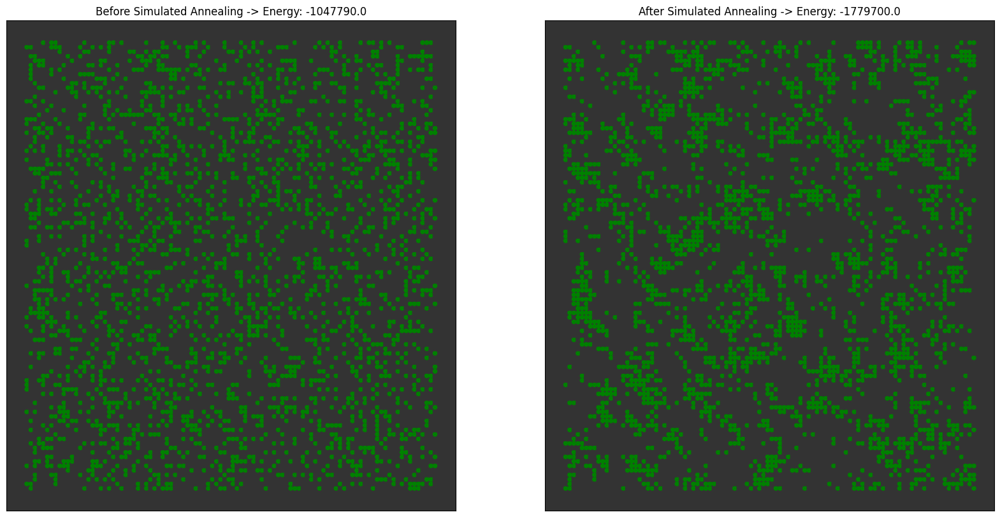

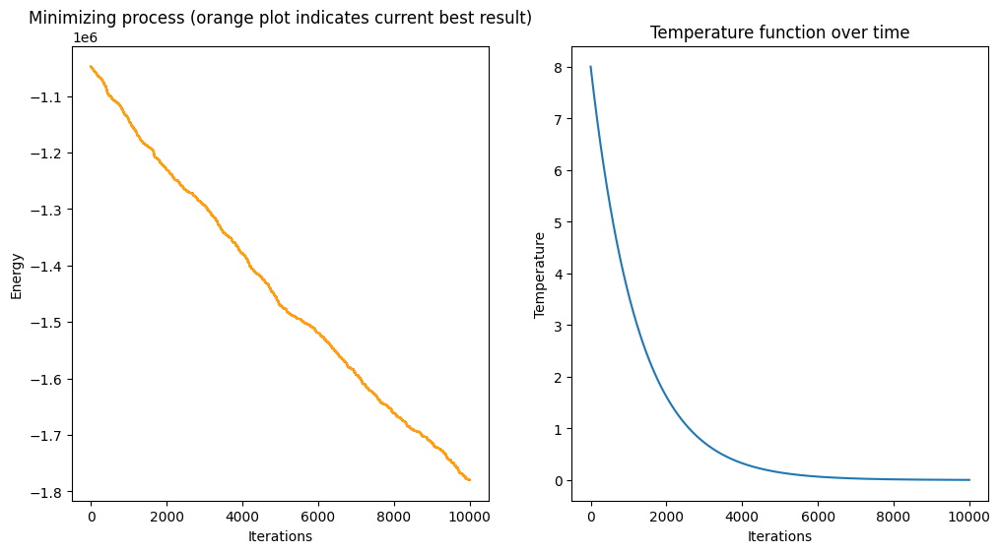

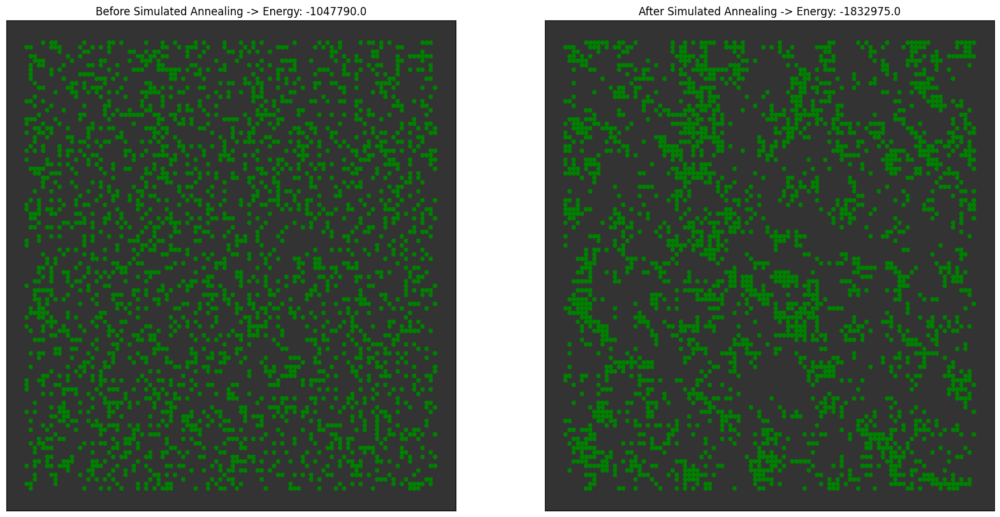

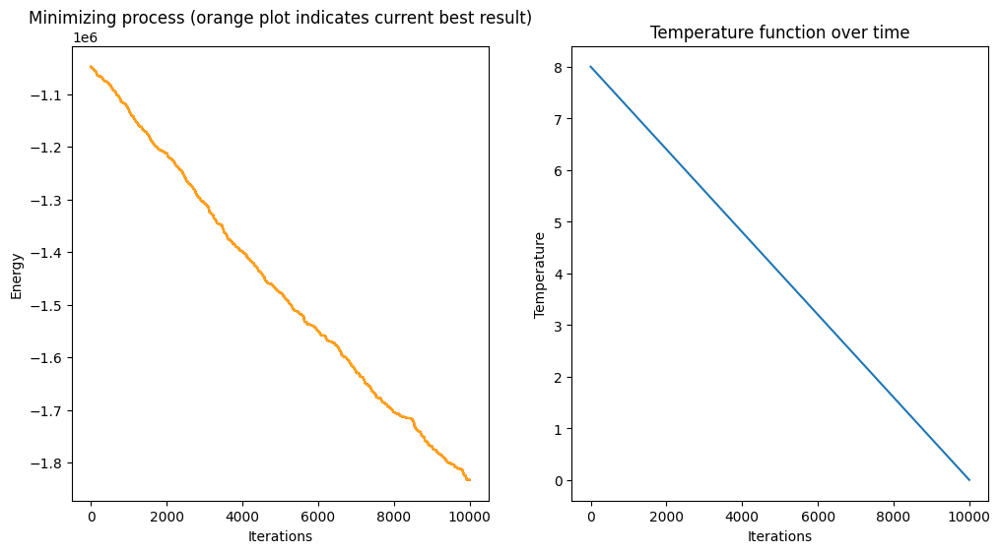

In [81]:
proceed_binary(100,0.25, 10000, 8, neighbourhood= "Around",exponential=True, func = lambda x :(-5) * x**3, both=True)

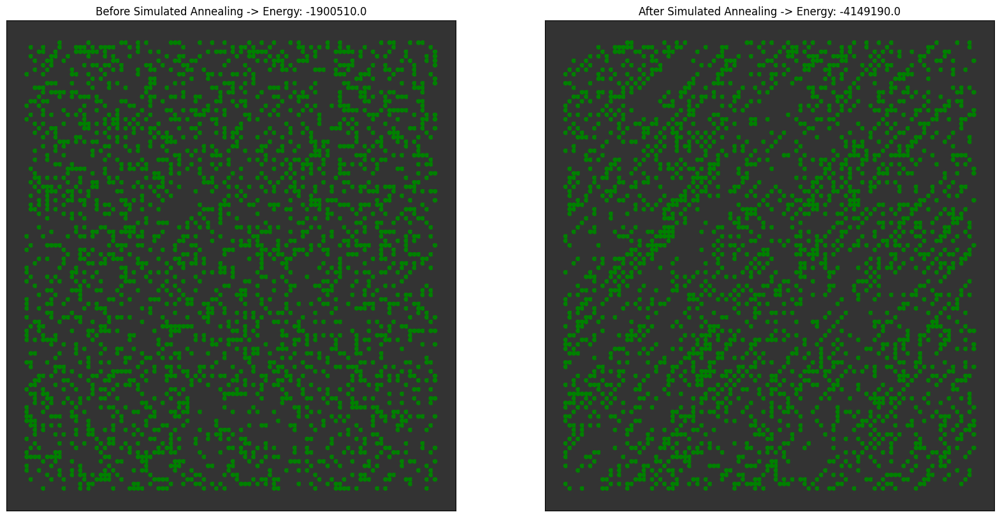

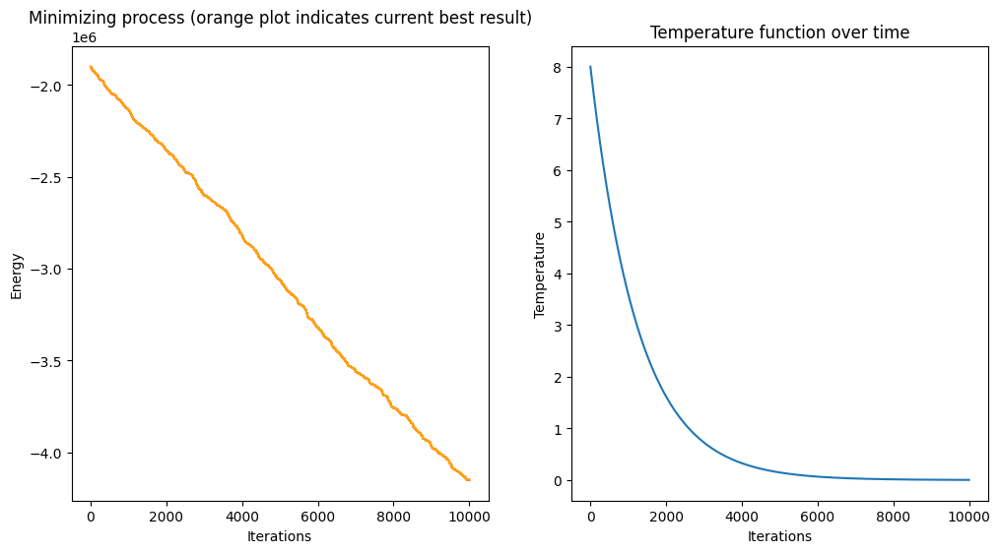

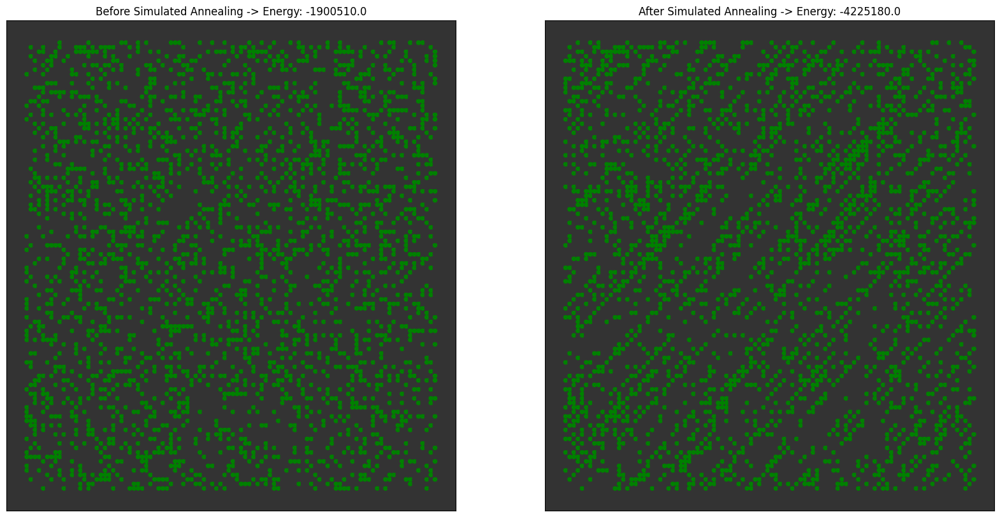

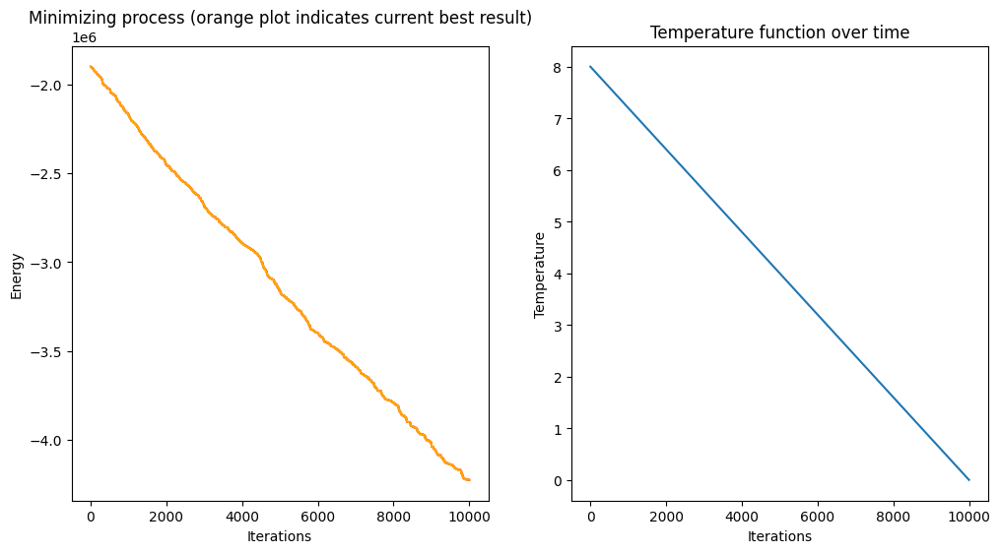

In [83]:
proceed_binary(100,0.25, 10000, 8, neighbourhood= "Cross_5",exponential=True, func = lambda x :(-5) * x**3,both = True)

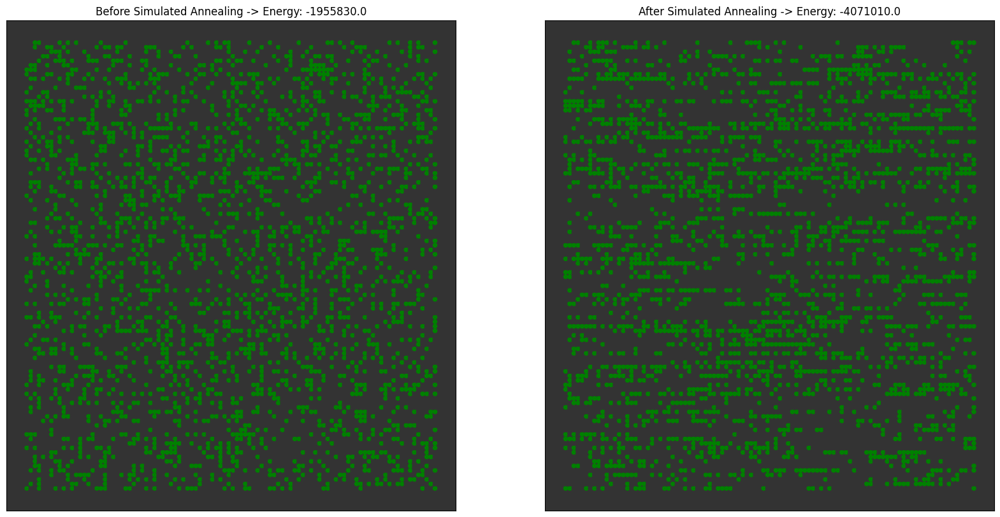

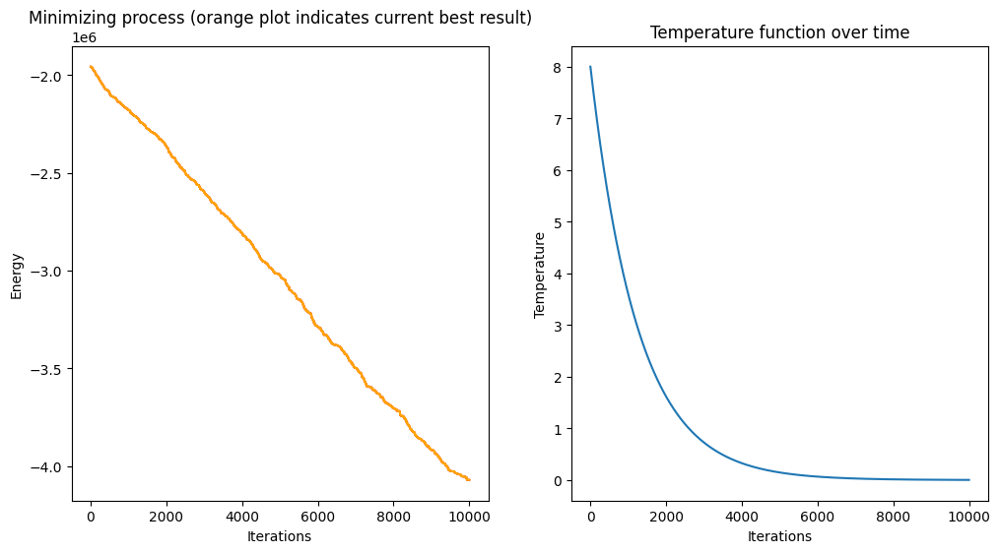

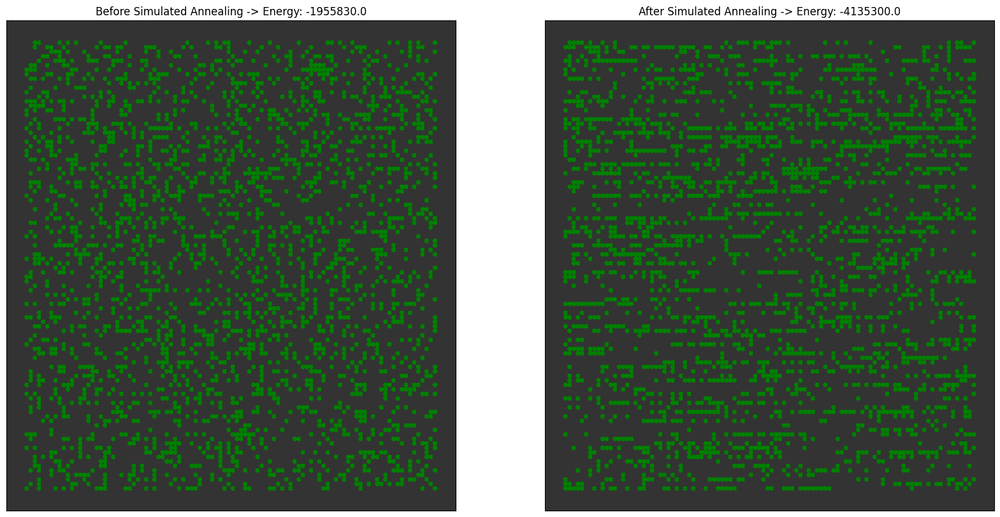

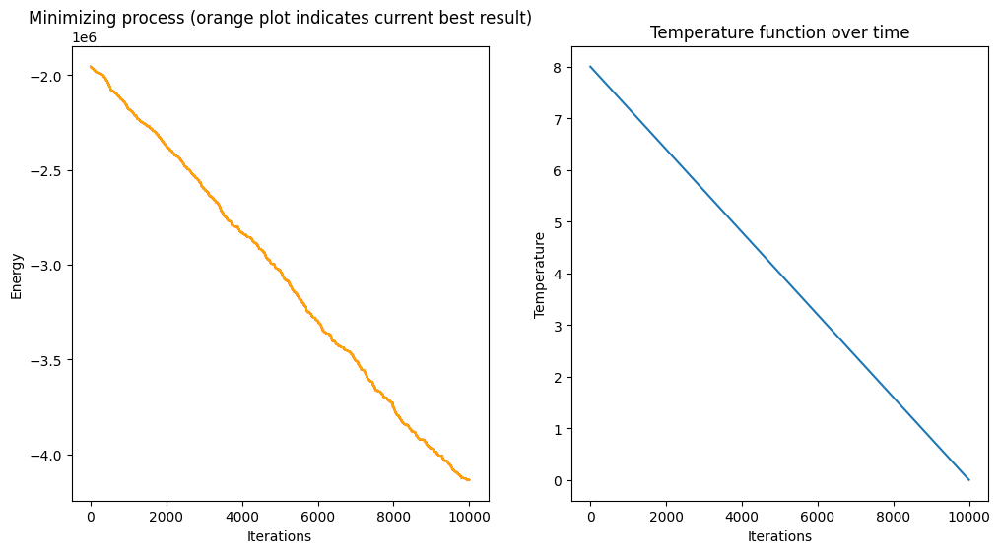

In [84]:
proceed_binary(100,0.25, 10000, 8, neighbourhood= "Row_5",exponential=True, func = lambda x :(-5) * x**3, both= True)

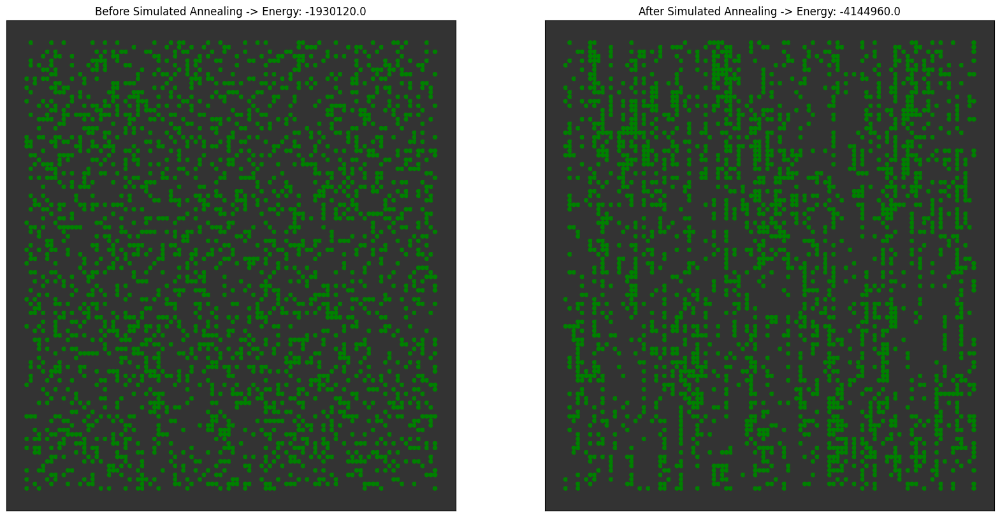

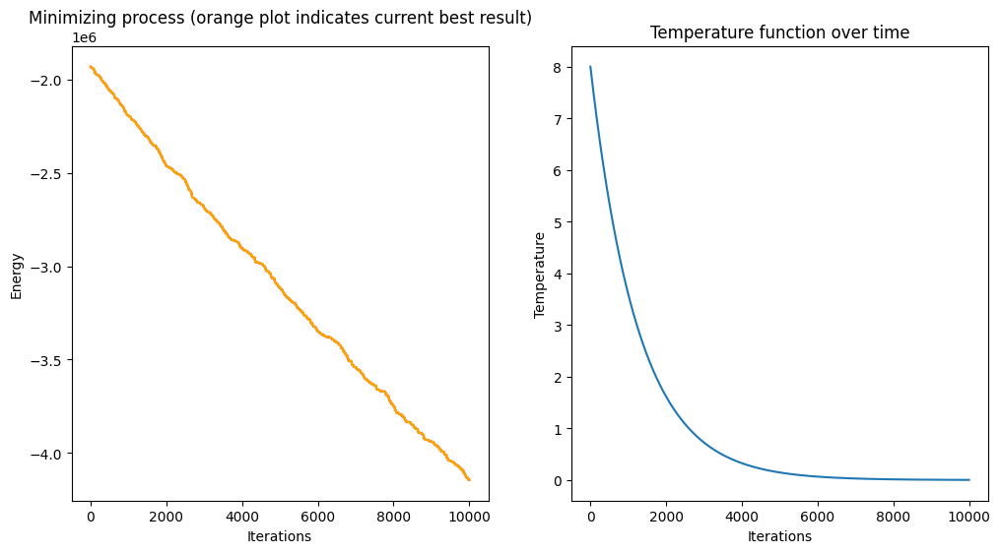

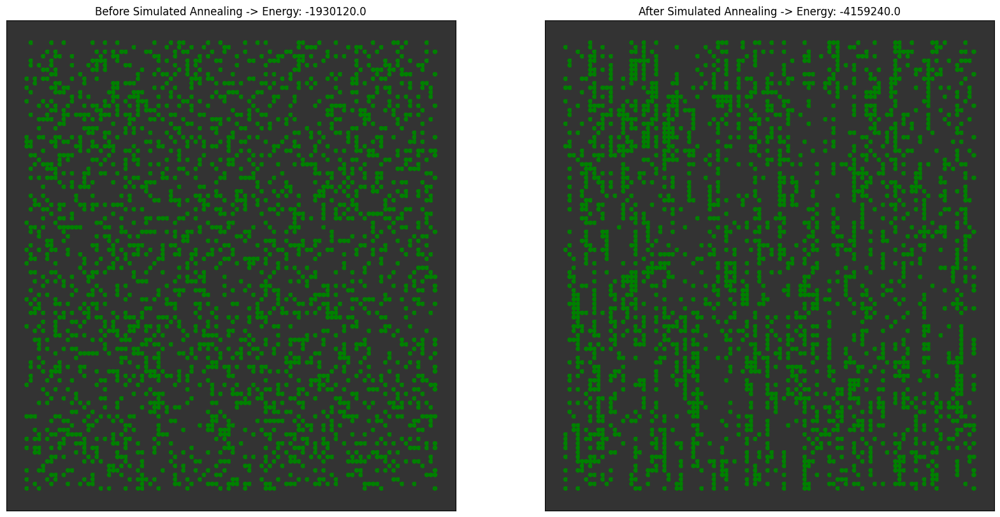

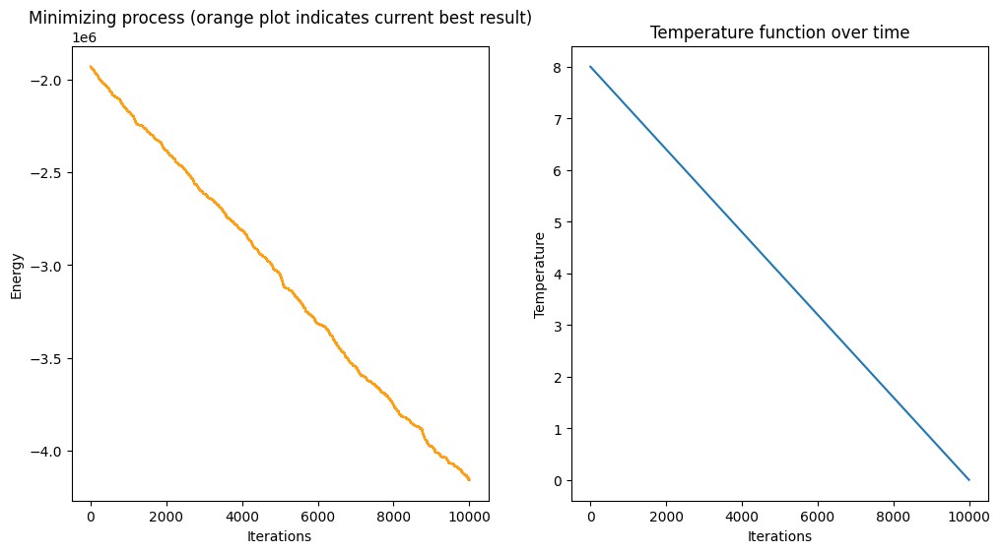

In [86]:
proceed_binary(100,0.25, 10000, 8, neighbourhood= "Col_5",exponential=True, func = lambda x :(-5) * x**3, both= True)

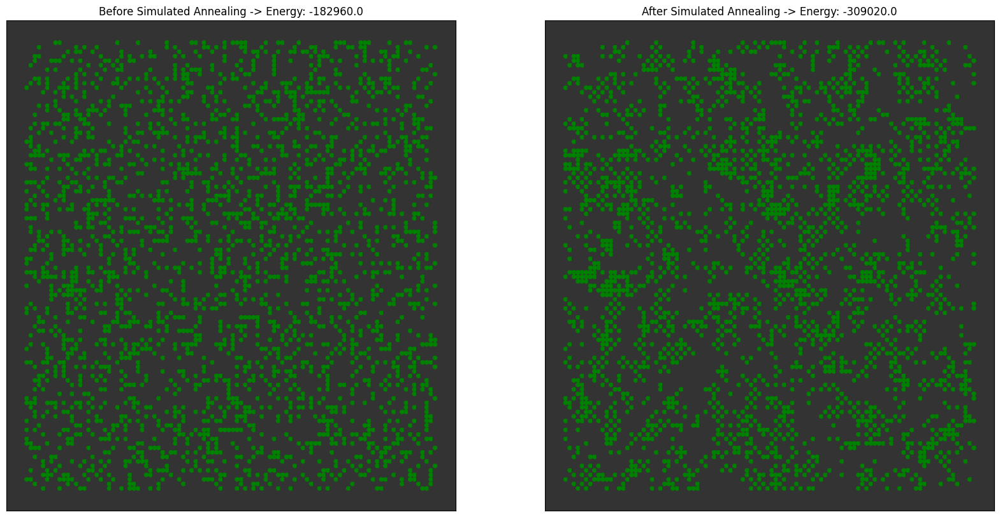

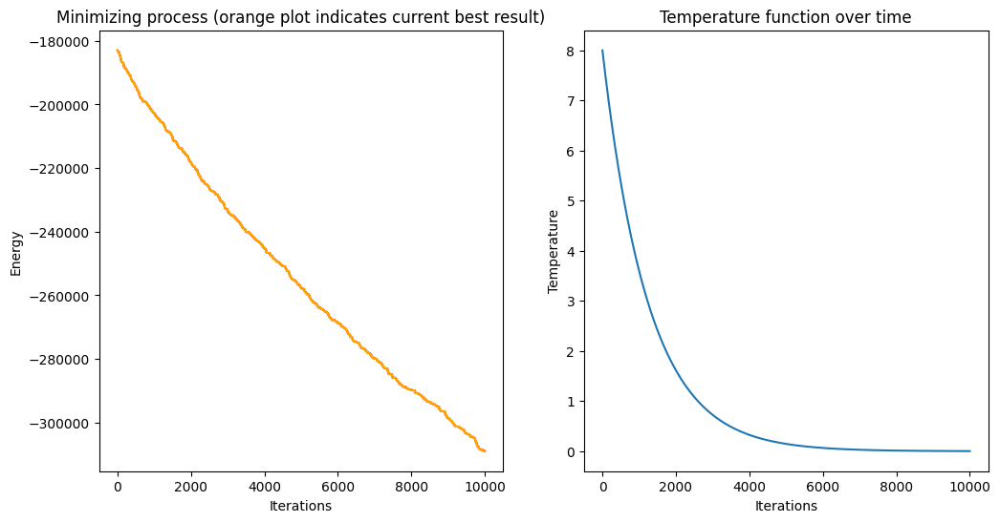

In [87]:
proceed_binary(100,0.25, 10000, 8, neighbourhood= "Vertical_Horizontal",exponential=True, func = lambda x :(-5) * x**3)

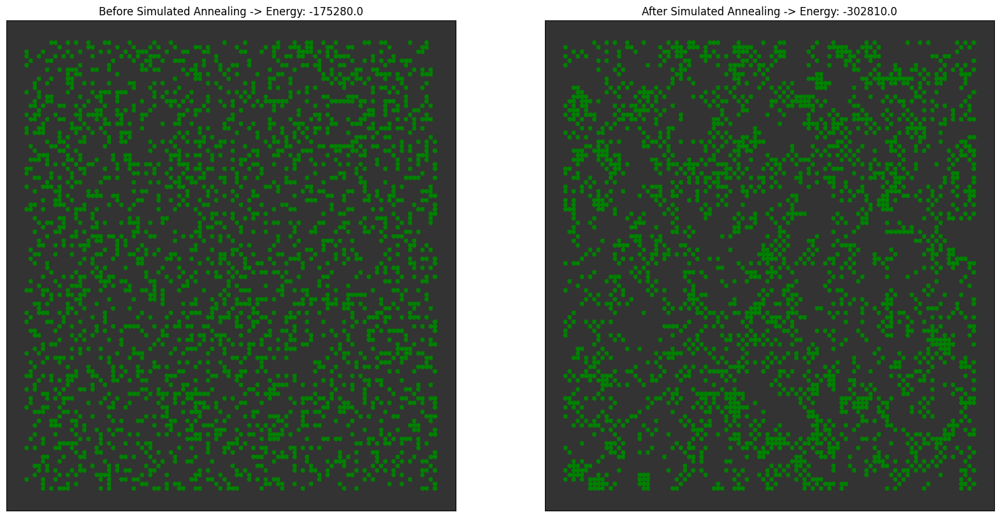

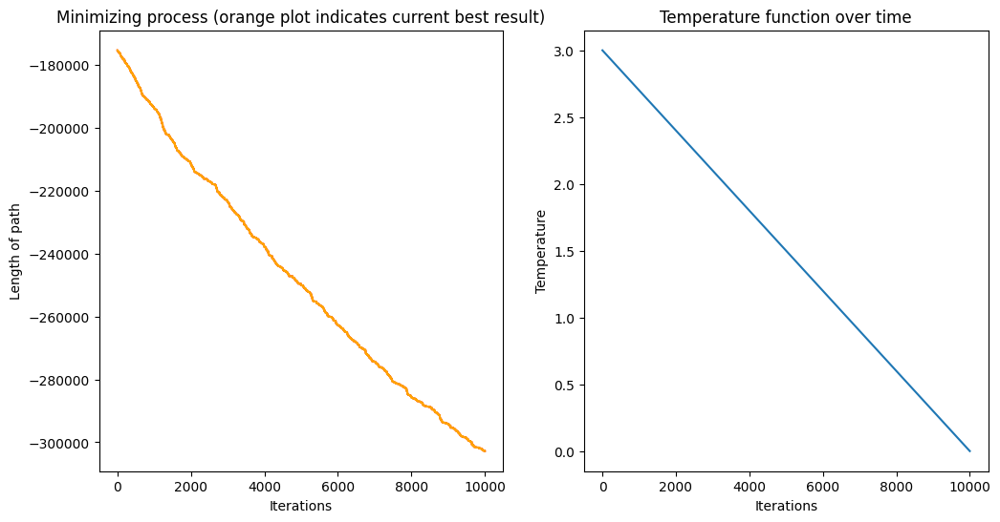

In [77]:
proceed_binary(100,0.25, 10000, 3, neighbourhood= "Vertical_Horizontal",exponential=False, func = lambda x :(-5) * x**3)

## Wnioski
Zauważamy, że w tym przypadku wykres energii od liczby iteracji przyjmuje zupełnie inny charakter niż w poprzednim zadaniu. Wynika to prawdopodobnie z faktu, że praktycznie każda operacja poprawia energię układu, przy czym sama energia nie ulega nigdy zmianie o dużą wartość. W związku z tym, nie obserwujemy znaczącej różnicy pomiędzy użyciem funkcji liniowej a ekspotencjalnej w przypadku temperatury. Najwidoczniej efekt polaryzacji widać przy użyciu sąsiedztw: `Row_5`, `Col_5` i `Cross_5`. Dla sąsiedztwa `Around` obserwujemy powstanie większych skupisk punktów obok siebie i widocznych przerw energetycznych w układzie (czarne większe plamy).

# Zadanie 3
W zadaniu 3 dążymy do rozwiązania sudoku z zastosowaniem symulowanego wyrzażania. Podobnie jak we wcześniejszych przykładach skorzystamy z klasy abstrakcyjnej `SA` oraz `Temperature`.
Dodatkowo w tym zadaniu będziemy korzystali z:
- `Sudoku_energy` - klasa obliczająca energię danego stanu i przechowująca funkcję, którą chcemy minimalizować
- `Sudoku` - klasa rozwiązująca problem z zastosowaniem metody symulowanego wyrzażania. Na początku wczytujemy sudoku z pliku tekstowego. Przygotowałem 4 plansze znalezione na internecie: jedna prosta, druga hard, trzecia expert i czwarta evil (nazwy poziomów trudności stwierdzonych przez platformę z sudoku). Zaczynam od uzupełnienia sudoku losowo kolejnymi wierszami różnymi liczbami, tak, że po tej operacji każdy wiersz zawiera liczby od 1 do 9 i nie ma pustych miejsc. Algorytm w każdej iteracji losuje numer wiersza, a następnie 2 losowe indeksy na poziomie danego wiersza. Następnie analizujemy skuteczność danego działania wyliczając liczbę powtórzeń na poziomie kolumn i małych kwadratów 3x3 ( na poziomie wierszy w pierwszym kroku zagwarantowaliśmy wartość funkcji równej 0). Tak zdefiniowaną funkcję minimalizujemy. W przypadku osiągnięcia wartości 0, przerywamy algorytm.

### Funckja wczytująca sudoku z pliku tekstowego

In [4]:
def load_sudoku(filepath):
    result = []
    with open(filepath,'r') as f:
        # tmp = [line.strip().split(',') for line in f
        # print(tmp)
        result = np.array(
            [[int(a) if a != 'x' else np.nan for a in line.strip().split(',')] for line in f])
    return np.array(result)

In [44]:

from collections import Counter
class Sudoku_energy():
    def __init__(self, func = lambda x: x-1 if x>1 else 0) -> None:
        self._func = func
   
    def calculate_rect(self, matrix ):
        flattened= matrix.flatten()
        tmp = list(Counter(flattened).values())
        # print(f'tmp rect: {tmp}')
        result = sum(map(self._func, tmp))
        # print(result)
        return result
    
    def calculate_energy(self, array):
        tmp = list(Counter(array).values())
        result = sum(map(self._func, tmp))
        return result




class Sudoku(SA):
    def __init__(self, no_iteration: int, max_temperature, exponential, sudoku):
        super().__init__(no_iteration, max_temperature, exponential)
        self._best_results_values = list()
        self._energy = Sudoku_energy()
        self._sudoku = np.copy(sudoku)
        self._starting_sudoku = np.copy(sudoku)
        self._starting_energy=None
        self._nan_row_indexes = None
        self._best_result = None
        self._n = 9 
        self.manage_nans()
        self._best_sudoku = np.copy(self._starting_sudoku)
        self.generate_starting_energy()
    
    def draw_sudoku(self,sudoku):
        separation = '='*26
        for i in range(self._n):
            output=''
            if i%3 ==0:
                output+=separation+'\n'
            
            sep = 0
            for item in sudoku[i]:

                if sep%3==0:
                    output+='| '
                sep+=1
                if np.isnan(item):
                    output+='x '
                    continue
                output+=f'{int(item)} '
            output+=' '
            output+='|'
            print(output)
        print(separation)

    def manage_nans(self):
        n = self._n
        row_nan_dict = dict()
        row_free_values = dict()
        for i in range(n):
            row = self._starting_sudoku[i]
            indexes = [j for j in range(n) if np.isnan(row[j])]
            row_nan_dict[i] = indexes
        self._nan_row_indexes = row_nan_dict
        matrix = self._starting_sudoku
        row_free_values = self.get_free_row_values()
        for i in range(n):
            for j in row_nan_dict[i]:
                tmp_indexes = row_free_values[i]
                matrix[i, j] = tmp_indexes.pop(np.random.randint(0, len(tmp_indexes)))
        self._starting_sudoku = matrix
        self._sudoku = np.copy(matrix)

    def generate_starting_energy(self):
        matrix = self._sudoku
        result =0
        for i in range(self._n):
            #rows
            result+=self._energy.calculate_energy(matrix[i])
            
            #cols
            result+=self._energy.calculate_energy(matrix[:,i])
            rectangle = matrix[3*(i//3):3*(i//3 +1), 3*(i%3): 3*(i%3+1)]
            result+= self._energy.calculate_rect(rectangle)
        self._best_result=result
        self._starting_energy = result            



    def get_free_row_values(self):
        res = dict()
        values = set(range(1,10))
        n = self._n
        for i in range(n):
            row_values = set([s for s in self._starting_sudoku[i] if not np.isnan(s)])
            diff_set = values - row_values
            res[i] = list(diff_set)
        return res

    def solve(self):
        self._best_results_values.append(self._best_result)
        n = self._n
        best_result = self._starting_energy
        current = best_result
        matrix = self._sudoku
        for i in range(self._no_iteration):
            if np.isclose(self._best_result,0):
                break
            row_n = np.random.randint(0, n)
            row_indexes = self._nan_row_indexes[row_n]
            v,u = np.random.choice(row_indexes,2, replace=False)
            # print(v,u,row_n)
            difference = self.calculate_difference(v,u, row_n)
            after = current-difference
            if self._temperature.check_probability(current,after):
                matrix[row_n, v], matrix[row_n,u] = matrix[row_n, u], matrix[row_n, v]
                current = after 
            if after < self._best_result:
                self._best_result = after
                current = after
                self._best_sudoku = np.copy(matrix)
            self._each_step_result.append(current)
            self._temperature.cool_down()
            self._best_results_values.append(self._best_result)
            # print(current)
    def calculate_difference(self,v,u,row):
        matrix = self._sudoku
        curr = 0
        col_v = np.copy(matrix[:,v])
        col_u = np.copy(matrix[:,u])
        rect_v = np.copy(matrix[3*(row//3):3*(row//3+1), 3*(v//3): 3*(v//3+1)])
        rect_u = np.copy(matrix[3*(row//3):3*(row//3+1), 3*(u//3): 3*(u//3+1)])

        same_rect = v//3 == u//3 

        curr += self._energy.calculate_energy(col_v)
        curr += self._energy.calculate_energy(col_u)
        curr += self._energy.calculate_rect(rect_v)
        if not same_rect:
            curr += self._energy.calculate_rect(rect_u)
        # print(f'cols before : \n{col_v}\n{col_u}')
        col_v[row] = matrix[row,u]
        col_u[row] = matrix[row,v]
        # print(f'rect_v beofre : {rect_v}\n rect_u before: {rect_u}')
        rect_v[row % 3, v % 3] = matrix[row, u]
        if same_rect:
            rect_v[row % 3, u % 3] = matrix[row, v]
        else:
            rect_u[row % 3, u % 3] = matrix[row, v]
        # print(f'rect_v after : {rect_v}\n rect_u after: {rect_u}')
        # print(f'cols after : \n{col_v}\n{col_u}')
        
        after = 0
        after += self._energy.calculate_energy(col_v)
        after += self._energy.calculate_energy(col_u)
        after += self._energy.calculate_rect(rect_v)
        if not same_rect: 
            after += self._energy.calculate_rect(rect_u)
        return curr-after
        # return after- curr

    def draw_temperature(self, ax):
        self._temperature.draw(ax)

    def draw_temperature_and_process(self):
        fig, ax = plt.subplots(1, 2, figsize=(20, 10))
        self.draw_temperature(ax[1])
        self.draw_minimizing_process(ax[0])
        ax[0].set_title(
            "Minimizing process (orange plot indicates current best result)")
        ax[1].set_title("Temperature function over time")
        plt.show()

    def draw_minimizing_process(self, ax):
        # ax , fig = plt.subplot(2,1,1)

        ax.plot(range(len(self._each_step_result)), self._each_step_result, color = "red")
        ax.plot(range(len(self._best_results_values)),
                self._best_results_values, color="orange")
        # ax.set_ylim(bottom = 0)
        ax.set_xlabel("Iterations")
        ax.set_ylabel("Energy")
        # plt.show()



In [53]:
def solve_sudoku(no_iteration, max_temperature, filepath,exponential=True ):
    sud_mat = load_sudoku(filepath)
    sudoku = Sudoku(no_iteration, max_temperature, exponential, sud_mat)
    print(f'Initial sudoku with energy : {sudoku._starting_energy}')
    sudoku.draw_sudoku(sudoku._starting_sudoku)
    # print(sudoku._best_result)
    sudoku.solve()
    print(f'Final sudoku with energy : {sudoku._best_result}')
    sudoku.draw_sudoku(sudoku._best_sudoku)
    # print(sudoku._best_result)
    sudoku.draw_temperature_and_process()



Initial sudoku with energy : 43
| 5 4 8 | 2 6 3 | 7 9 1  |
| 6 8 1 | 2 7 3 | 4 9 5  |
| 1 9 7 | 6 2 4 | 5 8 3  |
| 8 2 3 | 1 6 9 | 5 4 7  |
| 5 1 4 | 6 3 2 | 9 7 8  |
| 9 5 7 | 4 1 3 | 6 2 8  |
| 6 5 9 | 3 2 8 | 1 7 4  |
| 1 4 8 | 7 5 2 | 9 3 6  |
| 7 9 3 | 4 1 8 | 6 5 2  |
Final sudoku with energy : 0
| 4 3 5 | 2 6 9 | 7 8 1  |
| 6 8 2 | 5 7 1 | 4 9 3  |
| 1 9 7 | 8 3 4 | 5 6 2  |
| 8 2 6 | 1 9 5 | 3 4 7  |
| 3 7 4 | 6 8 2 | 9 1 5  |
| 9 5 1 | 7 4 3 | 6 2 8  |
| 5 1 9 | 3 2 6 | 8 7 4  |
| 2 4 8 | 9 5 7 | 1 3 6  |
| 7 6 3 | 4 1 8 | 2 5 9  |


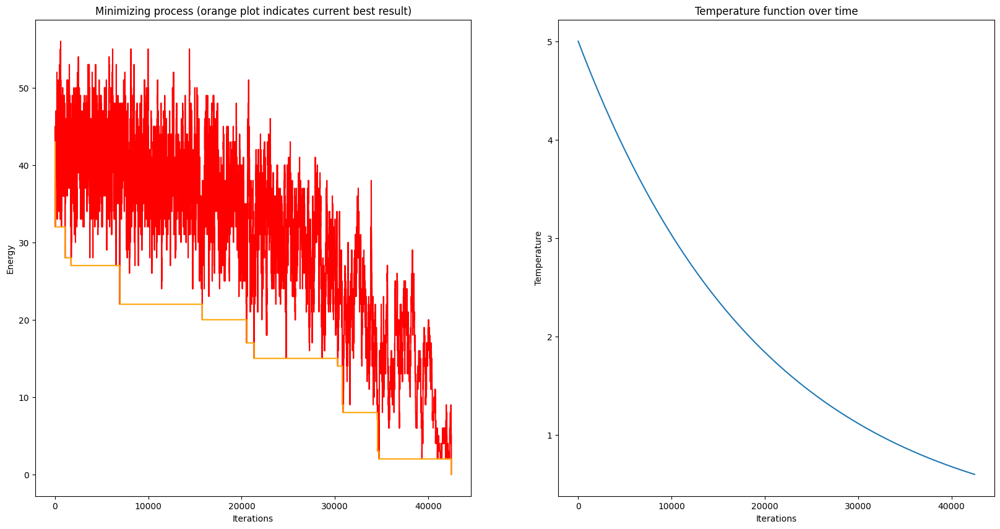

In [64]:
solve_sudoku(100000,5,'./sudoku_boards/sudoku_1.txt')

Initial sudoku with energy : 50
| 3 7 6 | 4 8 1 | 9 2 5  |
| 8 1 4 | 6 5 7 | 2 3 9  |
| 8 3 6 | 7 2 9 | 4 1 5  |
| 6 5 8 | 3 4 2 | 9 7 1  |
| 6 7 3 | 9 5 1 | 2 8 4  |
| 3 6 5 | 8 9 2 | 7 4 1  |
| 3 1 7 | 2 8 6 | 9 5 4  |
| 6 4 1 | 9 2 5 | 7 8 3  |
| 9 1 3 | 5 7 2 | 8 6 4  |
Final sudoku with energy : 2
| 5 7 2 | 4 8 3 | 1 9 6  |
| 4 1 9 | 5 6 2 | 7 3 8  |
| 3 8 6 | 7 1 9 | 4 5 2  |
| 2 9 8 | 3 4 1 | 5 6 7  |
| 1 3 4 | 6 5 7 | 2 8 9  |
| 7 6 5 | 8 9 2 | 3 4 1  |
| 8 4 7 | 2 3 6 | 9 1 5  |
| 6 2 1 | 9 4 5 | 8 7 3  |
| 9 5 3 | 1 7 8 | 6 2 4  |


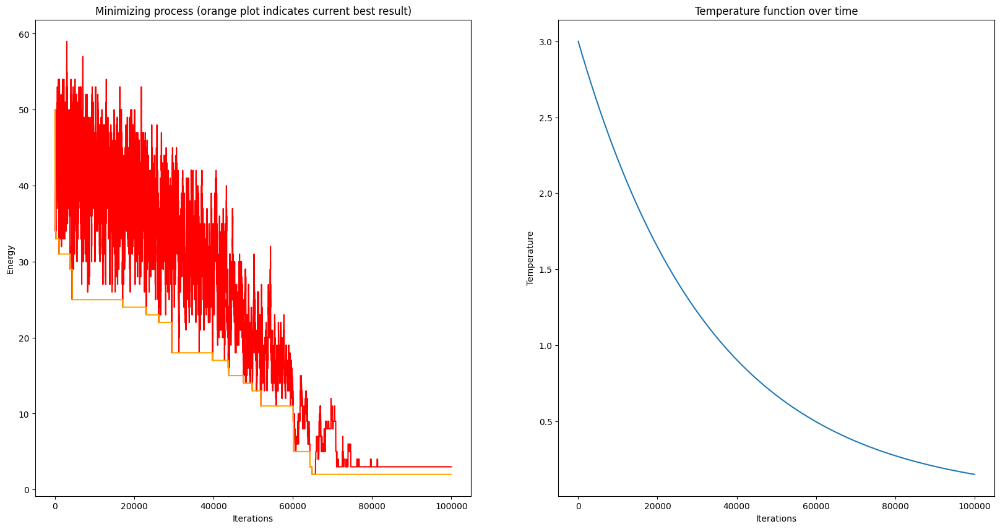

In [65]:
solve_sudoku(100000,3,'./sudoku_boards/sudoku_2.txt')

Initial sudoku with energy : 48
| 8 9 7 | 6 2 3 | 1 5 4  |
| 2 3 8 | 6 5 7 | 4 1 9  |
| 8 3 9 | 7 6 2 | 4 1 5  |
| 8 3 5 | 7 9 4 | 6 2 1  |
| 9 6 1 | 3 4 2 | 5 7 8  |
| 5 2 1 | 9 6 7 | 8 4 3  |
| 7 2 8 | 3 6 5 | 4 9 1  |
| 4 9 6 | 5 1 7 | 3 8 2  |
| 5 9 8 | 2 4 1 | 7 3 6  |
Final sudoku with energy : 4
| 5 1 6 | 9 7 3 | 2 4 8  |
| 2 3 4 | 6 8 1 | 9 5 7  |
| 8 7 9 | 4 5 2 | 6 1 3  |
| 3 2 5 | 7 9 8 | 1 6 4  |
| 9 6 8 | 1 2 4 | 3 7 5  |
| 7 4 1 | 5 3 6 | 8 2 9  |
| 4 8 3 | 2 6 5 | 7 9 1  |
| 6 5 7 | 4 1 9 | 3 8 2  |
| 1 9 2 | 8 4 7 | 5 3 6  |


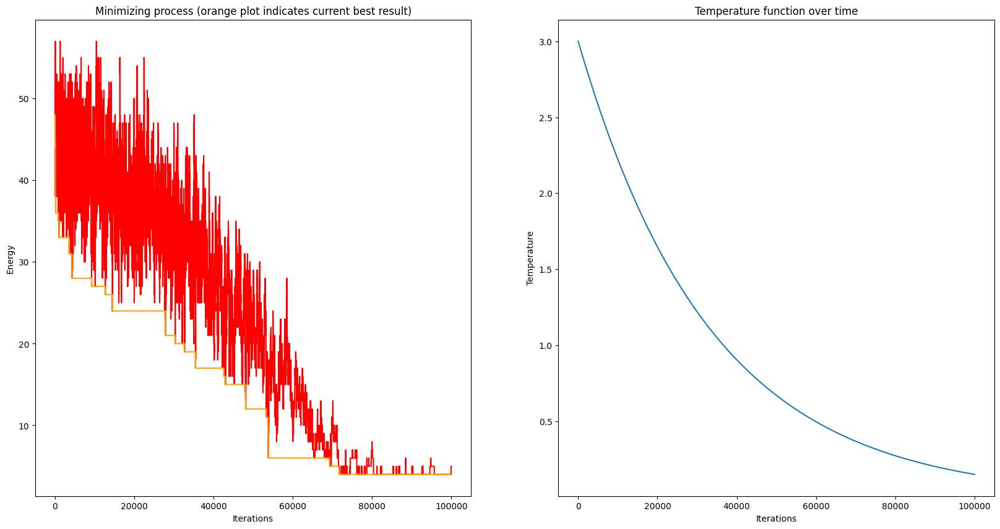

In [62]:
solve_sudoku(100000,3,'./sudoku_boards/sudoku_3.txt')

Initial sudoku with energy : 49
| 9 3 7 | 2 5 6 | 1 4 8  |
| 3 4 9 | 6 8 1 | 7 2 5  |
| 2 5 9 | 7 1 3 | 8 6 4  |
| 1 9 5 | 7 3 2 | 8 6 4  |
| 8 1 7 | 5 6 9 | 2 3 4  |
| 6 8 3 | 5 9 7 | 2 1 4  |
| 1 3 5 | 2 8 4 | 9 7 6  |
| 5 9 7 | 4 3 6 | 1 8 2  |
| 3 7 4 | 2 6 9 | 1 5 8  |
Final sudoku with energy : 2
| 8 1 7 | 3 2 6 | 9 4 5  |
| 3 4 9 | 8 5 1 | 7 2 6  |
| 2 5 6 | 9 4 7 | 8 1 3  |
| 9 7 5 | 4 3 2 | 6 8 1  |
| 4 2 1 | 5 6 8 | 3 9 7  |
| 6 8 3 | 1 9 7 | 2 5 4  |
| 1 3 2 | 6 8 5 | 4 7 9  |
| 5 9 8 | 7 3 4 | 1 6 2  |
| 7 6 4 | 2 1 9 | 5 3 8  |


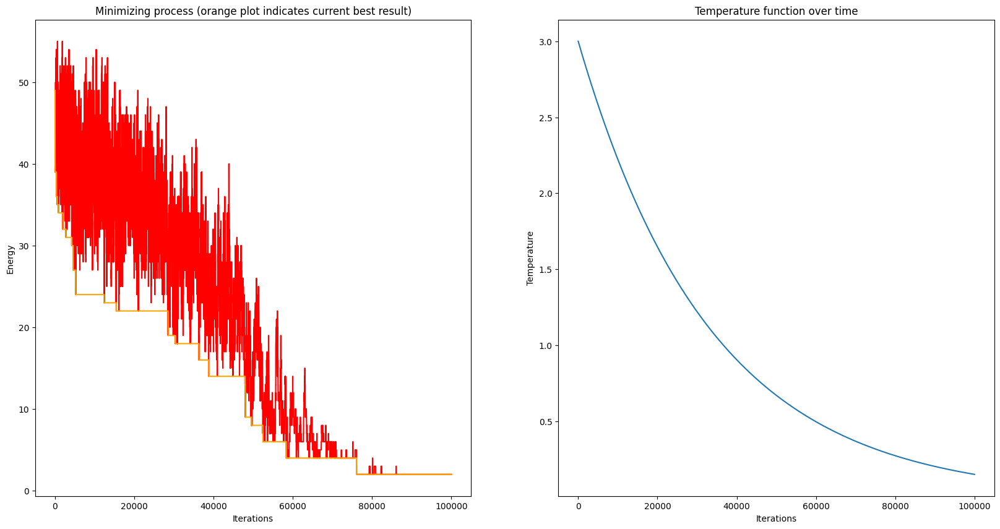

In [61]:
solve_sudoku(100000,3,'./sudoku_boards/sudoku_4.txt')

### Wnioski
Widzimy, że algorytm rozwiązuje poprawnie w zadanej liczbie iteracji problem dla najprostszego wariantu sudoku, a w pozostałych nieznacznie się myli. Ewentualne błędy mogą być spowodowane niemożliwością wyjścia z pewnego minimum lokalnego na danym szczeblu wykonania algorytmu.